# Evaluate Sample Data

This notebook is used to evaluate the sample dialogues collected with friends and family.

## To run the code...

make sure you have the following files downloaded and located in the respective folders: <br>
'image_data.json' <br>

To read the log data, you have two options:
1. make sure you downloaded the file containing the logs to read the logs from a local file: <br>
'./all_logs_.txt' <br>


2. to execute the API call, you need a folder called  <br>
'logs' stored in the same directory like this notebook, and <br>
'config.ini' with the correct settings. You can obtain the admin token from the University server.

The easier way is to pursue the first option. The advantage of using the second option is that you receive all log file collected until this very moment. However, this option is not recommended, because the log structure might have changed, which might cause errors when running the code.


In [2]:
import json
import configparser
import requests
import os

from operator import itemgetter

import re
import pandas as pd
import nltk
import datetime
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import matplotlib.pyplot as plt

from collections import OrderedDict

from matplotlib import rcParams
from IPython.display import display, Image




In C:\Users\Asus\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\Asus\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\Asus\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In C:\Users\Asus\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\Asus\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle

In [3]:
room_list_relevant_dialogues = [176,177, 178,179,180,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,225,226,227]
room_dialogues = [176, 177, 178, 179, 180, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 225, 226, 227]


In [4]:
#define list of utterances typically made by the DiTo bot:
dito_utterances = ['**Welcome to the DiTo Game!**','has joined the game.',
                   'Make sure to save your token before leaving the room!',
                   'Are you sure? Please discuss some more!',
                   'Let\'s wait for your partner to also type **/same**.',
                   'Your partner thinks that your views are different. Type **/different** and a **brief description** if you agree.',
                   'Are you ready? Please type **/ready** to begin the game.',
                   'Your partner seems to still want to discuss some more. Send /different ore /same again once you two are really finished.',
                   'Sorry, but I do not understand this command.',
 'For this game you need to provide decriptions and discuss with your partner. Remember the following command to play the game:',
 'Type **/difference** together with a brief description of the difference once you and your partner think you are done.',
                    'Your partner thinks that you see the same image. Type **/same** if you agree.',
                   'For example : **/difference no red pyramid**',
                   'Woo-Hoo! The game will begin now.',
                   'Please type **/ready** to begin the game.',
                   'Now, waiting for your partner to type /ready.',
 'You have already typed /ready.','Your partner is ready. Please, type /ready!',
                    'You both seem to be having a discussion for a long time. Could you reach an agreement and provide an answer?',
                    'The game is over! Thank you for participating!',
                   'Type **/difference** together with a brief description of the difference once you and your partner think you are done. For example : **/difference no red pyramid**',
                'has left the game. Please wait a bit, your partner may rejoin.','Your partner seems to be away for a long time!',
 'Please enter the following token into the field on the HIT webpage, and close this browser window.',
                   'For this game you need to provide decriptions and discuss with your partner. Remember the following command to play the game:\n\n(1) Type **/difference** together with a brief description of the difference once you and your partner think you are done.\nFor example : **/difference no red pyramid**',
                   'Please enter the following token into the field on the HIT webpage, and close this browser window. ',
                   'Here is your token: ',
 'You will be moved out of this room in 30.0-45.0s.','Make sure to save your token before that.',
                  'The game ended because you were gone for too long!', 'For example : **/different no red pyramid**',
                  'Please type **/ready** to begin the game.\n']

In [6]:

path_ = './all_logs_.txt'

In [7]:
def sort_rooms(path_):
    ''' method to aggregate all relevant rooms (chat rooms) found in the logs,
    arrange them in a sorted list. log entries with the room_id 'None' and 1 are ignored
    
        returns: a nested list of all log entries sorted by the id of the log entry, and the room_id
        args: path_ - folder path to file where logs are stored 
        
    call methods - read_logs
    '''
    #grouped_lists, lines_json = read_logs(path_)
    lines_json = read_logs(path_)
    
    #first, collect all room ids
    room_ids = []
    for e in lines_json:
        if 'room_id' in e.keys():
            if e.get('room_id') not in room_ids:
                room_ids.append(e.get('room_id'))
    #remove the entry that says 'None' and the one that says '1', since '1' is a waiting room irrelevant to the task
    room_ids.remove(None)
    room_ids.remove(1)
    
    #map the room_ids in the logs to the log entry ids:
    room_ids_ =[]
    for e in lines_json:
        if e.get('room_id') in room_ids:
            room__id_tuple = (e.get('room_id'), e.get('id'))
            if room__id_tuple not in room_ids_:
                room_ids_.append(room__id_tuple)
                
    
    room_ids_.sort()
    room_ids.sort()
    
    #aggregate the mappings of log entry id and room_id separately, such that all mappings per room are in a single list
    # -> one list of (room_id, log entry id) tuples per room
    collect_=[]
    for room in room_ids:
        collect_per_room = []
        for ids_ in room_ids_:
            if ids_[0]==room and ids_ not in collect_per_room: 
                collect_per_room.append(ids_)
        collect_.append(collect_per_room)
        
    #collect all actual log entries per room, using the mapping created in the previous step. 
    all_logs_per_room = []
    for collection_ in collect_:
        collect_logs_ = []
        for c in collection_:
            for line in lines_json:
                if line.get('id')==c[1] and line not in collect_logs_:
                    collect_logs_.append(line)
        all_logs_per_room.append(collect_logs_)
        
    return all_logs_per_room


In [8]:
def collect_rooms(lines_json):
    
    '''collect all room_ids together with the timestamps
        returns: all_room_nums - a list of all room numbers found in the logs, 
                
        args: lines_json  - the json content read from the log files
    '''
    collect_room_ids_timestamps = []
    all_rooms = []
    room_ids = []
    for elem in lines_json:
        if 'room_id' in elem.keys() and elem.get('room_id')!='null':
            collect_room_ids_timestamps.append((elem.get('room_id'), elem.get('date_created'), elem.get('id')))
            all_rooms.append(elem.get('room_id'))
        if 'room_id' in elem.keys() and elem.get('room_id')!='null' and elem.get('room_id')!=1:
            if elem.get('room_id') not in room_ids:
                room_ids.append(elem.get('room_id'))

    all_room_nums = set(all_rooms)
    
    return all_room_nums


In [9]:
def api_call_for_logs(path_):
    
    ''' API call to collect all existing logs, 
     logs are written into single files
    returns: lines_json - all logs found in json format
        
        args: path_ - folder path to file where logs need to be stored
    '''
    #read data from config necessary to make the API call:
    CONFIG = configparser.ConfigParser()
    CONFIG.read('config.ini')
    ADMIN_TOKEN = CONFIG['slurk']['admin_token']
    URL_ = CONFIG['logs']['url']
    SESSION = CONFIG['session']['name']
    
    #in case there is no directory to store all the logs, create it:
    if not os.path.isdir('./logs/' + SESSION):
        os.makedirs('./logs/' + SESSION)

    #prepare API call:    
    headers = {
        'Accept': 'application/json',
        'Authorization': 'Bearer '+ADMIN_TOKEN
    }

   # API call
    res = requests.get(URL_, headers=headers)
    #read the API request result
    my_json = res.content.decode('utf8')
    lines_json = json.loads(my_json)
    
    #write all log entries in json format into one file:
    log_file = open(path_,'w+')
    log_file.write(my_json)
    log_file.close()
    
    with open(path_) as f: 
        lines_json = json.load(f)
        
    return lines_json

In [10]:
def read_logs(path_):
    ''' method to collect logs either via API call, or from a locally stored file containing all logs 
        returns: lines_json - all logs found in json format
        
        args: path_ - folder path to file where logs need to be stored
        
    call method 'collect_rooms' to create grouped_lists
    '''
    
    # in order to fetch the data directly from the database, the method for the API call can be used
    # caution! it is not recommended to use this method, 
    #since it requires correct setting wrt admin_token in the config-file
    
    #to use the method, remove the comment token from line 15 and put comments on line 17 and 18
    #lines_json = api_call_for_logs(path_)
    
    with open(path_) as f: 
        lines_json = json.load(f)

    all_room_nums = collect_rooms(lines_json)
    
    return lines_json


    
    

In [11]:
def call_for_messages(path_):
    ''' method to aggregate all relevant messages per round, together with the images displayed
        returns: all_messages - list of tuples containing 
                                    a list of the utterances made by players in the dialog, 
                                    the room id
                                    the mapping of the image link to the player name to whom the image was displayed
                all_logs_per_room - a collection of the logs per room (i.e. per dialogue/game round)
        args: path_ - folder path to file where logs are stored
                                
    '''
    all_messages = []
    
    all_logs_per_room = sort_rooms(path_)
    for room_logs in all_logs_per_room:
        rel_utt=[]
        room_ = room_logs[0].get('room_id')  
        if room_ in room_dialogues:

            user_id,replaced_,user_id_image = user_name_mapping(room_logs)
            dialog_, d_timestamp_pair = collect_dialogues(room_logs,replaced_, user_id)          
            player_name_image_id = collect_player_name_image(user_id_image, replaced_)
            
            d_timestamp_pair.sort(key=itemgetter(1))
            for sorted_ in d_timestamp_pair:
                rel_utt.append(sorted_[0])
            
            all_messages.append((rel_utt, room_, player_name_image_id))

    return all_logs_per_room,all_messages



In [12]:
def get_dialogue_data(file_path):
    ''' method to aggregate all data related to the logs 
        returns: len(rel_elems) - the number of utterances per dialogue
                time_delta - delta between starting and finishing a dialogue
                formulation_variant - the underlying task formulation variant of the dialogue
                rel_elems[:5] - firt utterances in the dialogue
                delta_in_secs - time delta in seconds
                image_id - the id of the images displayed to the players in the game round
                room_id - the id of the task room (i.e. the id of the dialogue or game round) 
                rel_elems - all utterances made by players in the dialogue
                first_dt - the first relevant timestamp of the dialogue 
                last_dt - the last relevant timestamp of the dialogue
                utterance_player_coupled - the utterances collected per player
                end_game_commands - final commands sent by the players
        
        args: file_path - collection of logs related to the dialogue 
                                
    '''
    
    #define one of the two formulation variants - the other variant
    formulation_variant = 'Is there a difference?'
    list_timestamps = []

    rel_elems = []
    utterance_player_coupled = []
    
    image_id =0
    room_id = 0

    first_dt = []
    last_dt = []
    
    end_game_commands = []
    for log in file_path: 
        
        list_timestamps.append(log.get('date_created'))
                                        
        if log.get('event')=='command':
            if log.get('data').get('command')=='ready':
                first_dt.append(datetime.datetime.strptime(log.get('date_created'), '%Y-%m-%dT%H:%M:%S.%f'))
            else: 
                last_dt.append(datetime.datetime.strptime(log.get('date_created'), '%Y-%m-%dT%H:%M:%S.%f'))
                end_game_commands.append([log.get('data').get('command'),datetime.datetime.strptime(log.get('date_created'), '%Y-%m-%dT%H:%M:%S.%f'),log.get('user_id')])
            
        if log.get('event')=='text_message' and log.get('data').get('message') not in dito_utterances and log.get('user_id')!=91 \
        and 'has joined the game' not in log.get('data').get('message') and 'For this game you need to provide decriptions' not in log.get('data').get('message'):
            rel_elems.append(log.get('data').get('message'))
            if log.get('user_id')!=91:
                utterance_player_coupled.append((log.get('data').get('message'),log.get('user_id')))
            if 'image that you see' in log.get('data').get('message'):
                if 'image that you see is ' in log.get('data').get('message'):
                    formulation_variant = 'Spot the difference!'
                
        if log.get('room_id')!=0 and log.get('room_id')!=None and log.get('room_id')!=1:
            room_id = log.get('room_id')
        if log.get('data').get('attribute')=='src':
            receiver_ = log.get('receiver_id')
            image_source_ = log.get('data').get('value')
            
            #image_path = 'https://raw.githubusercontent.com/luise-strietzel/slurk-bots/master/image_selection/form2/target/13196.png'
            first = 0
            if 'target/' in image_source_: 
                first = image_source_.find('target/')+7
            elif 'source/' in image_source_:
                first = image_source_.find('source/')+7
            else:
                break

            last = image_source_.find('.png')
            image_id = image_source_[first:last]
            
    collect_players = []
    for e in utterance_player_coupled:
        if e[1] not in collect_players:
            collect_players.append(e[1])
            
    if len(collect_players)==1:
        collect_players.append(collect_players[0])
        
    elif len(collect_players)==0:
        collect_players = [500, 501]   
        
        
    #get the first and the last timestamp entry
    first_entry = list_timestamps[0]
    last_entry = list_timestamps[-2]
    #convert the timestamp entries into propper datetime format to calculate with it
    date_time_str = first_entry
    s_time = datetime.datetime.strptime(first_entry, '%Y-%m-%dT%H:%M:%S.%f')
    e_time = datetime.datetime.strptime(last_entry, '%Y-%m-%dT%H:%M:%S.%f')
    
    #calculate the delta of the timestamps
    time_delta = e_time-s_time
        #obtain delta in seconds
    delta_in_secs = time_delta.total_seconds()  

    
    if len(end_game_commands)==0:
        entry_player_1 = ['no_info', e_time,collect_players[0]]
        entry_player_2 = ['no_info', e_time,collect_players[1]]
        end_game_commands = [entry_player_1, entry_player_2]
    
    #cutting out the message and the name (i.e. random pseudonym) of the player who wrote it
        
    return len(rel_elems), time_delta, formulation_variant, rel_elems[:5], delta_in_secs, image_id,\
            room_id, rel_elems, first_dt, last_dt, utterance_player_coupled, end_game_commands

In [13]:
def end_commands_sent(list_commands, players):
    ''' method to aggregate all relevant messages per round, together with the images displayed
        returns: commands_players_sent - the labels given in the commands sent by the players to finish the game
                long_commands_players - list of entire commands sent by players (not only the same/different labeling)
                 
        args: list_commands - list of all commands sent in the dialogue, together with the player id 
                    players - player ids
        
                                
    '''
    commands_players_sent = []
    long_commands_players = []
    for p in players: 
        commands_sent_per_player = []
        for e in list_commands: 
            if e[2]==p:
                commands_sent_per_player.append((e[0],e[1]))
          
        command_sent=''
        if len(commands_sent_per_player)>1:
            datetimes = []
            for c in commands_sent_per_player: 
                datetimes.append(c[1])
                
            max_ = max(datetimes)
            for c in commands_sent_per_player:
                if c[1]==max_:
                    command_sent = e[0]

        elif len(commands_sent_per_player)==1:
            command_sent= commands_sent_per_player[0]
            
        elif len(commands_sent_per_player)==0:
            command_sent = ('no_info', 'no datetime')
            
        player_sent = (p,command_sent[0].split(' ')[0])
        commands_long = (p, command_sent)
        commands_players_sent.append(player_sent)
        long_commands_players.append(commands_long)
    return commands_players_sent,long_commands_players     
    

In [14]:
def user_name_mapping(room_logs):
    '''To display the names given to the users instead of the user_id when showing the dialogs later, 
    this method creates a mapping from the user_id to the name.
    Also the mapping from the image shown to the player and the player name is made.
    
        returns: user_id - list of the user_ids in the specific game round 
                        (is equal to room_id, because there is one chat room per game round)
                 replaced_ - list of mapping tuples to assign the user names to the correct user ids
                 user_id_image - list of tuples containing the user_id coupled with the link to the image that this user see
                 
        args: room_logs - one list of log entries per room, as available from calling the method sort_rooms
    
    '''
    user_id = []
    user_name_other = []
    user_id_image = []
    for log_ in room_logs:
        #The user names are not explicitely stated in the logs. However, they can be obtained from a greeting message that 
        #the DiTo bot sends to the other user. It say '000 has joined the game.' '000' is here the gap filler for the actual name
        if log_.get('data').get('message')!=None and log_.get('data').get('message').endswith('has joined the game. '):
            user_id.append(log_.get('receiver_id'))
            user_name_other.append(log_.get('data').get('message').split(' ')[0])
        
        #The links to the image data are explicitely given in the logs. 
        #The id of the user who received the image is given in the same log entry 
        if log_.get('data').get('attribute')=='src':
            receiver_ = log_.get('receiver_id')
            image_source_ = log_.get('data').get('value')
            user_id_image.append((receiver_,image_source_))
          
    #The user names need to be mapped correctly. 
    #In the log entry of the DiTo bot message '000 has joined the game', 
    #the given receiver_id is equal to the user_id that needs to be mapped to the other name 
    # e.g. the DiTo bot sends two messages: 
    
    # message: 'funny has joined the game', receiver_id: 34
    # message: 'homeless has joined the game', receiver_id: 35
    
    #now, the name 'funny' has to be mapped to user_id 35, and 'homeless' to user_id 34
    
    replaced_=[]
    if len(user_name_other)==1 and len(user_id_image)>=2: 
        other_user_name='other user'
        user_name_other.insert(0,other_user_name)
    
    if len(user_id)==1 and len(user_id_image)>=2:
        if user_id[0]==user_id_image[0][0]:
            other_user_id=user_id_image[1][0]
        elif user_id[0]==user_id_image[1][0]:
            other_user_id=user_id_image[0][0]
        user_id.append(other_user_id)
    if len(user_id)>=2:
        replaced_ = [(user_name_other[0],user_id[1]),(user_name_other[1],user_id[0])]

    return user_id, replaced_, user_id_image
    

In [15]:
def collect_dialogues(room_logs,replaced_, user_id):
    '''method to collect the dialog sections in the logs
        returns: dialog_ - a list of utterance, together with the utterer (i.e. the user name)
                dialog_timestamp_pair - paired list of utterances and timestamps (necessary for sorting the utterances)
        args: room_logs - one list of log entries per room, as available from calling the method sort_rooms
              user_id - list of the user_ids in the specific game round 
                        (is equal to room_id, because there is one chat room per game round)
              replaced_ - list of mapping tuples to assign the user names to the correct user ids
                 
    '''
    dialog_ = []
    
    dialog_timestamp_pair = []
    for log_ in room_logs:
        #collecting all the utterances wrt. common grounding - i.e. utterances made by the players, 
        #not instructions by the DiTo bot
        rel_utterances = []
        #check if there are two users in the game in the first place
        # and if the user uttering the message is a player (the user_id list contains only the ids of the players, not DiTo)
        if log_.get('event')=='text_message' and log_.get('user_id') in user_id and len(replaced_)>=2:
            user_name =''
            if log_.get('user_id')==replaced_[0][1]:
                user_name = replaced_[0][0]
            elif log_.get('user_id')==replaced_[1][1]:
                user_name = replaced_[1][0]
                                    
            if user_name!='DiToBot':
                if log_.get('event')=='text_message' and log_.get('data').get('message') not in dito_utterances:
                    dialog_timestamp_pair.append((user_name+' : '+log_.get('data').get('message'), log_.get('date_created')))
                    
    dialog_timestamp_pair.sort(key=itemgetter(1))

    for d in dialog_timestamp_pair:
        dialog_.append(d[0])
        
    return dialog_, dialog_timestamp_pair
    

In [16]:
def collect_player_name_image(user_id_image, replaced_):
    '''method to map the images displayed to the players to their names in the game round
        returns: player_name_image_ - a list of tuples, containing the player name and the link of the image displayed
        args: user_id_image - list of tuples containing the user_id 
                            coupled with the link to the image that this user sees
              replaced_ - list of mapping tuples to assign the user names to the correct user ids
                 
    '''
    
    player_name_image_=[]
    for user_image in user_id_image:
        for elem in replaced_:
            if user_image[0]==elem[1]:
                player_name = elem[0]
                image_id = user_image[1]
                player_sees = (player_name, image_id)
                player_name_image_.append(player_sees)
    return list(set(player_name_image_))

In [17]:
def count_turns(relevant_messages_per_room):
    ''' method to count turns in a dialogue round
        returns: count_turns - the number of actual turns in the dialogue
        args: relevant_messages_per_room - list of tuples containing 
                                                a list of the utterances made by players in the dialog, 
                                                the room id
                                                the mapping of the image link to the player name to whom the image was displayed
    '''
    count_turns_=[]
    for m_room in relevant_messages_per_room: 
        n_turns = -1
        if m_room[1] not in room_dialogues:
            continue
        else:
            current_name=''
                    
            for m in m_room[0]:
                if m.split(' :')[0]!= current_name:
                    current_name =m.split(' :')[0] 
                    n_turns+=1
        count_turns_.append(n_turns)

    
    return count_turns_

In [18]:
def display_dialogues(relevant_messages_per_room):
    ''' method to to display the dialogs, the images shown to the users and the room id
        return: relevant_messages_per_room - cleared list of messages
        
        args: relevant_messages_per_room - list of tuples containing 
                                                a list of the utterances made by players in the dialog, 
                                                the room id
                                                the mapping of the image link to the player name to whom the image was displayed
    '''
   
    for m_room in relevant_messages_per_room: 
        if m_room[1] not in room_list_relevant_dialogues:
            relevant_messages_per_room.remove(m_room)
            continue
        else:
            if len(m_room[0])>=6:

            #in case there are no image links stored for some reason, skip the element (even remove the entire dialog section)
                if len(m_room[2])<2:
                    relevant_messages_per_room.remove(m_room)
                else:
                    
                    print('Room '+str(m_room[1]))
                    im1 = Image(m_room[2][0][1])
                    im2 = Image(m_room[2][1][1])
                    img = [im1,im2]
                    print(m_room[2][0][0]+' sees :  ')
                    im = Image(m_room[2][0][1])
                    display(im)
                    print(m_room[2][1][0]+' sees : ')
                    im = Image(m_room[2][1][1])
                    display(im)

                    for m in m_room[0]:
                        print(m)
                    print()
               

    return relevant_messages_per_room

In [19]:
def player_messages_content_token(m_room):
    ''' method to display the dialogs, the images shown to the users and the room id
        return: player_name - the name of the player given automatically and randomly
                p1 - a list of utterances sent by player 1 to the other player 
                p2 - a list of utterances sent by player 2 to the other player 
                dev_all_content_words_per_room - list of the content words sent in the dialogue 
                dev_content_words_whole_dialogue_share - a list of fractions expressing the share of content words per utterance
                
        args: m_room - messages sent by the players in the room, together with the player's name 
    '''
    player_name = []
    p1 = []
    p2 = []
    dev_all_content_words_per_room = []
    dev_content_words_whole_dialogue_share = []
    
    for m in m_room:
        user_name = m.split(' : ')[0]
        if user_name not in player_name:
            player_name.append(user_name)

    for m in m_room:    
        text = m.split(' : ')[1:]
        if m.split(' : ')[0]==player_name[0]:
            p1.append(text)
        elif m.split(' : ')[0]==player_name[1]:
            p2.append(text)
            
        split_text = text[0].split(' ')
        no_stopwords = []
        for turn_ in split_text: 
            if turn_ not in stopwords.words('english'):
                no_stopwords.append(turn_)
            
        dev_all_content_words_per_room.append(len(no_stopwords))
        dev_content_words_whole_dialogue_share.append(len(no_stopwords)/len(split_text))
    return player_name ,p1,p2,dev_all_content_words_per_room,dev_content_words_whole_dialogue_share
            

In [20]:
def get_avg_token(p_):
    ''' method to get the average number of token
        return: avg_ - average number of tokens per message sent by player p_
                avg_wo_stopwords - average number of token without stopwords per message sent by player p_
                num_utt_ - total number of messages sent by player p_ in dialogue
                total_token_ - total number of tokens sent by player p_ in dialogue
                token_wo_stopwords_ - the number of tokens that are no stopwords sent by player p_
                dev_content_words_ - list of numbers of content token per message sent by player p_ to see if the number of
                                    content tokens is decreasing or increasing throughout the dialogue
                
        args: p_ - list of messages sent by a player 
    '''    
    num_utt_ = len(p_)
    #num_utt_p2 = len(p2)
        
    total_token_ =0
    token_wo_stopwords_ = 0
        
    dev_content_words_ = []
    for utt in p_: 
        message = utt[0]
        single_words = message.split(' ')
        total_token_=total_token_+len(single_words)
        for w in single_words:
            if w in stopwords.words('english'):
                single_words.remove(w)
        token_wo_stopwords_ = token_wo_stopwords_+len(single_words)
        dev_content_words_.append(len(single_words))
            
    avg_ = total_token_/num_utt_
    avg_wo_stopwords = token_wo_stopwords_/num_utt_


    return avg_,avg_wo_stopwords,num_utt_,total_token_,token_wo_stopwords_,dev_content_words_


In [21]:
def get_utterances_per_user(shortened_message_list):
    ''' method to obtain the development of content token usage throughout the dialogues
        return: all_player_utt_counts - list of total number of utterances made in a room
                all_player_utterances - list of dictionaries per room with the player name as key and the related messages as value
                rooms_ - a list of the game rooms
                dev_content_words - list over the the development of content token usage per room, per player
                dev_all_content_words - list over overall development of content token usage throughout the dialogues
                dev_content_words_share - list of content token usage per dialogue in general (not the development)

        args: shortened_message_list - a cleaned list of messages sent by the players for all rooms
    '''     
    
    all_player_utt_counts = []
    all_player_utterances = []
    rooms_ = []
    dev_content_words = []
    dev_all_content_words = []
    dev_content_words_share = []
        
    for m_room in shortened_message_list: 
        
        if m_room[1] not in room_dialogues:
            continue
            
       # print(m_room[1])
        players_utt = {}
        players_count = {}
        
        player_name ,p1,p2,dev_all_content_words_per_room,\
        dev_content_words_whole_dialogue_share = player_messages_content_token(m_room[0])            
               
        players_utt[player_name[0]]=p1
        players_utt[player_name[1]]=p2
        
        avg_p1, avg_p1_wo_stopwords,num_utt_p1,total_token_p1,\
        token_wo_stopwords_p1,dev_content_words_p1 = get_avg_token(p1)
    
        avg_p2, avg_p2_wo_stopwords,num_utt_p2,total_token_p2,\
        token_wo_stopwords_p2,dev_content_words_p2 = get_avg_token(p2)
        
        
        players_count['player1'] = {'total num utt':num_utt_p1,'total token num':total_token_p1,\
                                    'avg token num/utt':avg_p1, 'total token num wo stopwords':token_wo_stopwords_p1\
                                   , 'avg token num/utt wo stopwords': avg_p1_wo_stopwords}
        players_count['player2'] = {'total num utt':num_utt_p2,'total token num':total_token_p2,\
                                    'avg token num/utt':avg_p2, 'total token num wo stopwords':token_wo_stopwords_p2\
                                   , 'avg token num/utt wo stopwords': avg_p2_wo_stopwords}

        all_player_utt_counts.append(players_count)
        all_player_utterances.append(players_utt)
        rooms_.append(m_room[1])
        dev_content_words.append([dev_content_words_p1,dev_content_words_p2])
        
        dev_all_content_words.append(dev_all_content_words_per_room)
        dev_content_words_share.append(dev_content_words_whole_dialogue_share)
        
        
    return all_player_utt_counts, all_player_utterances,rooms_, dev_content_words, dev_all_content_words,dev_content_words_share


In [22]:
def main_exec(path_):
    ''' main method to obtain relevant data by (indirectly) calling methods defined above
        return:  shortened - cleared list of messages
                 players_count_utterances - list of total number of utterances made in a room
                players_utterances - list of dictionaries per room with the player name as key and the related messages as value
                rooms_ - a list of the game rooms
                dev_content_words - list over the the development of content token usage per room, per player
                dev_all_content_words - list over overall development of content token usage throughout the dialogues
                dev_content_words_share - list of content token usage per dialogue in general (not the development)
                all_messages - list of tuples containing 
                                    a list of the utterances made by players in the dialog, 
                                    the room id
                                    the mapping of the image link to the player name to whom the image was displayed


        args: path_ - file path of the file where the logs are stored 
    '''     

#    room_messages,all_messages, grouped_list = call_for_messages(path_)
    room_messages,all_messages = call_for_messages(path_)
    
    
    shortened = display_dialogues(all_messages)
    
    players_count_utterances, players_utterances,rooms_,dev_content_words,dev_all_content_words,\
    dev_content_words_share = get_utterances_per_user(shortened)
    
    return shortened, players_count_utterances, players_utterances,rooms_,dev_content_words,\
    dev_all_content_words,dev_content_words_share,all_messages



In [23]:
def transform_0_1_yes_no_list(manually_labeled_list_):
    ''' method to transform list of manually labeled data of '0' and '1' into lists of 'no' and 'yes'
        return:  transformed_list - list of the form 'no' and 'yes'

        args: manually_labeled_list_ - list of labels of the form '0' and '1' 
    '''  
    transformed_list=[]
    for entry in manually_labeled_list_:
        if entry==0:
            transformed_list.append('no')
        else:
            transformed_list.append('yes')
    return transformed_list

In [24]:
def players_labeled_correct_incorrect(final_commands,c_type):
    ''' method to set information on whether or not players found the correct label in a specific dialogue
        return:  players_labeled - string saying 'correct' or 'incorrect'

        args: final_commands - the final commands sent by the players in the dialogue
                        c_type - the change type represented in the image pair
            '''  
    different_ = ['d', 'different']
    same_ = ['s', 'same']
    
    common_label = ''
    if final_commands[0][1] in same_ and final_commands[1][1] in same_:
        common_label ='same'
    elif final_commands[0][1] in different_ and final_commands[1][1] in different_:
        common_label = 'different'
    elif (final_commands[0][1] in different_ and final_commands[1][1] in same_) or\
    (final_commands[0][1] in same_ and final_commands[1][1] in different_):
        common_label = 'inequal'
    elif (final_commands[0][1] in different_ and final_commands[1][1]=='no_info') or \
    (final_commands[0][1]=='no_info' and final_commands[1][1] in different_):
        common_label = 'different'
    elif (final_commands[0][1] in same_ and final_commands[1][1]=='no_info') or \
    (final_commands[0][1] =='no_info' and final_commands[1][1] in same_):
        common_label = 'same' 
        
    players_labeled = 'incorrect'
    if c_type=='same image': 
        if common_label=='same':
            players_labeled = 'correct'
        elif common_label=='different':
            players_labeled = 'incorrect'
        elif common_label =='inequal':
            players_labeled = 'labels differ'
    else:
        if common_label=='same':
            players_labeled = 'incorrect'
        elif common_label =='inequal':
            players_labeled = 'labels differ'
        elif common_label=='different':
            players_labeled = 'correct'
    
    return players_labeled


In [25]:

logs_per_room,all_messages = call_for_messages(path_)

In [26]:

with open("image_data.json", "r") as json_file:
    to_dict = json.load(json_file)

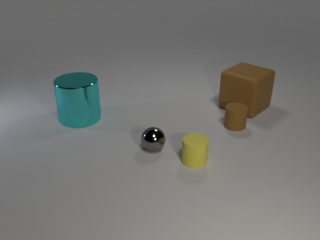

number of objects in image according to image data file: 
3
objects in image according to image data file:

metal

brown metal sphere
red rubber cylinder
cyan rubber cylinder




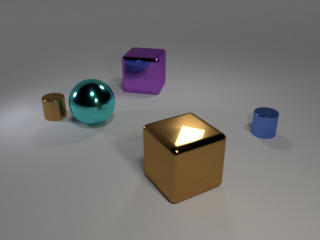

number of objects in image according to image data file: 
7
objects in image according to image data file:

rubber

red rubber cylinder
green metal cylinder
cyan rubber cube
blue metal cylinder
cyan rubber cylinder
green metal cube
blue rubber cylinder




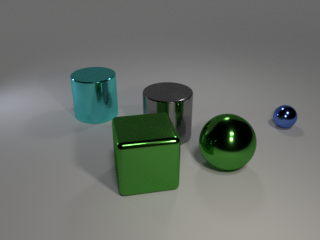

number of objects in image according to image data file: 
7
objects in image according to image data file:

rubber

brown rubber cube
purple rubber sphere
red rubber cube
cyan metal cylinder
gray rubber cylinder
green metal sphere
yellow metal sphere




In [27]:
example_image_ids = [10506,5613,9015]
basic_path = 'https://raw.githubusercontent.com/luise-strietzel/slurk-bots/master/image_selection/form2/source/'
ending = '.png'



for e in example_image_ids:
    im = Image(basic_path+str(e)+ending)
    display(im)
    print('number of objects in image according to image data file: ')
    print(len(to_dict[e]['objects']))
    print('objects in image according to image data file:')
    print()
    print(to_dict[e]['objects'][0]['material'])

    print()
    for obj in to_dict[e]['objects']:
        description = obj['names'][0].split(' ')[0]+' '+obj['material']+' '+obj['names'][0].split(' ')[1]
        print(description)
    print()
    print()


In [28]:

with open('image_data.json','r') as g: 
    lines = g.readlines()
  

In [29]:
#combine all lines of the image_data file to one single string
combi = ' '.join(lines)
#split the string along the image ids to obtain information per image
single_images = combi.split('"image_id"')
#check the number of elements - it should cover all the images in the CLEVR simsg dataset
len(single_images)

21311

In [31]:
# Object Addition     : 0 - 5124
# Relationship change : 5125 - 10127
# Object Removal      : 10128 - 16339
# Attribute Change    : 16340 - 21300

nums_and_c_type = []
#the first element of the list single_images does not contain relevant image data
for elems in single_images[1:]:  
    #the number of objects is indirectly given by the number of object descriptions
    number_objects = int(elems.split('relationships')[0].count('material'))
    
    #cut out the image_id
    image_id = int(elems.split('objects')[0][2:].split(',\n')[0])
    
    #classify the change types according to the image id
    #the classification was build manually
    if image_id < 5125:
        change_type ='object addition'
    elif 5125<= image_id <10128:
        change_type ='position change'
    elif 10128<= image_id < 16340:
        change_type ='same image'
    else:
        change_type ='attribute change'
    
    #write the information about number of objects and change types into a list together with the image id:
    nums_and_c_type.append([image_id,number_objects, change_type])
        


In [32]:
num_objects=[5,7,3,5,3,4,6,7,4,3,5,7,5,7,6,6,6,4,4,4,5,6,7,7,7,7,5,7,7,6,4,5,6]
len(num_objects)

33

In [33]:
form_type_list, time_, number_utterances, first_few_utterances, time_d_in_secs,\
change_type, room_, utt_count_player_1, utt_count_player_2, utt_avg_player_1, utt_avg_player_2, \
utt_avg_no_stopwords_player_1,utt_avg_no_stopwords_player_2, player_1_command,players_label,\
player_2_command, image_same_different, p_1_sent, p_2_sent, entire_command_sent= [],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[]

for elem in logs_per_room[170:]:

    file_p = elem
    n_utterances, time_d, form, first_utterances, delta_secs, image_id, room_id, rel_utterances,\
    first_datetime, last_datetime, utt_player_coupled, commands_sent = get_dialogue_data(file_p)
    commands_per_room = []
    for command_ in commands_sent:
        command_text = command_[0]
        commands_per_room.append(command_text)
            
    n_obj = nums_and_c_type[int(image_id)][1]
    c_type = nums_and_c_type[int(image_id)][2]
    
    #collect relevant dialog data in the list defined above
    if n_utterances<6:
        continue
 
    if room_id in room_dialogues:
        room_.append(room_id)
        time_.append(time_d)
        form_type_list.append(form)
        time_d_in_secs.append(delta_secs)
        number_utterances.append(n_utterances)    
        first_few_utterances.append(first_utterances)
        change_type.append(c_type)

        min_=0
        max_=0
        if len(first_datetime)>0:
            min_ = min(first_datetime)
        else:
            min_=0
        if len(last_datetime)>0:
            max_ = max(last_datetime)
        else:
            max_ =0
        if min_!=0 and max_!=0:
            time_diff = max_-min_

    players = []
    for utt in utt_player_coupled:
        if utt[1] not in players:
            players.append(utt[1])
            
    if len(commands_sent)==0:
        continue
    else:
        final_commands, long_commands = end_commands_sent(commands_sent,players)
        p_1_sent.append(long_commands[0][1][0])
        p_2_sent.append(long_commands[1][1][0])
    
    if room_id in room_:
        entire_command_sent.append(commands_per_room)
        
    if room_id in room_dialogues: 
        if final_commands[0][1]=='s':
            player_1_command.append('same')
        elif final_commands[0][1]=='d':
            player_1_command.append('different')
        else:
            player_1_command.append(final_commands[0][1])

        if final_commands[1][1]=='s':
            player_2_command.append('same')
        elif final_commands[1][1]=='d':
            player_2_command.append('different')
        else:
            player_2_command.append(final_commands[1][1])

        if c_type == 'same image':
            image_same_different.append('same image')
        else:
            image_same_different.append('different image')
            
        players_labeled = players_labeled_correct_incorrect(final_commands,c_type)
        players_label.append(players_labeled)
          
    
#transform seconds needed into float:
mins_needed = []
for s in time_d_in_secs:
    mins_needed.append(round((int(s/60)+((s%60)/100)),3))
    #print()
    


In [35]:
count_turns_ = count_turns(all_messages)


33

In [36]:

dict_={'task formulation':form_type_list,'seconds needed':time_d_in_secs,'time needed':time_,\
       'minutes needed':mins_needed,'room ID':room_,'# turns': count_turns_,'# utterances':number_utterances,\
       'first utterances':first_few_utterances,'change type':change_type, '# objects in image':num_objects, \
       'all commands sent':entire_command_sent}
#buid a dataframe from the dictionary
df = pd.DataFrame(dict_)
df

,task formulation,seconds needed,time needed,minutes needed,room ID,# turns,# utterances,first utterances,change type,# objects in image,all commands sent
0,Is there a difference?,222.173727,0 days 00:03:42.173727,3.422,176,4,6,"[ready, I see five objects, yes, two cubes and...",position change,5,"[no_info, no_info]"
1,Is there a difference?,432.141406,0 days 00:07:12.141406,7.121,177,12,21,"[I see seven objects, three balls, two cubes a...",same image,7,"[same, same]"
2,Is there a difference?,251.289290,0 days 00:04:11.289290,4.113,178,5,9,"[two balls, one cylinder, one red ball on the ...",same image,3,"[same, same]"
3,Is there a difference?,234.601790,0 days 00:03:54.601790,3.546,179,6,11,"[five objects, two yellow, one cyan metallic, ...",same image,5,"[same, same]"
4,Is there a difference?,549.741527,0 days 00:09:09.741527,9.097,180,4,8,"[three objects. , right to left: cyan metallic...",same image,3,"[same, same]"
5,Is there a difference?,251.478315,0 days 00:04:11.478315,4.115,182,9,18,"[four objects, i see four objects, two balls, ...",attribute change,4,"[different no green ball, different, different..."
6,Is there a difference?,224.720576,0 days 00:03:44.720576,3.447,183,14,21,"[6 objects, same, three cubes, yes, 3 cylinders]",same image,6,"[done, same, same]"
7,Is there a difference?,500.917459,0 days 00:08:20.917459,8.209,184,9,18,"[seven objects, two brown balls in the back, t...",position change,7,"[same, same]"
8,Is there a difference?,272.456845,0 days 00:04:32.456845,4.325,185,10,15,"[4 objects, two cubes, left to right, one blue...",same image,4,"[same, same, same]"
9,Is there a difference?,161.034545,0 days 00:02:41.034545,2.410,186,11,14,"[three objects, 3 objects, left to right: big ...",same image,3,"[same, same]"


In [37]:
print('minutes needed on average')
print(round(df['minutes needed'].mean(),3))
print()
print('utterances needed on average')
print(round(df['# utterances'].mean(),3))
print()
print('turns needed on average')
print(round(df['# turns'].mean(),3))
print()

minutes needed on average
10.813

utterances needed on average
17.485

turns needed on average
10.879



In [38]:
axis_font_title = {'fontname':'Arial', 'size':'16', 'weight' : 'bold'}
axis_font = {'fontname':'Arial', 'size':'14'}
axis_font_marker = {'fontname':'Arial', 'size':'12', 'color':'blue'}

In [39]:
count_change_types = df.groupby('change type').count()
count_change_types

,task formulation,seconds needed,time needed,minutes needed,room ID,# turns,# utterances,first utterances,# objects in image,all commands sent
change type,,,,,,,,,,
attribute change,7,7,7,7,7,7,7,7,7,7
position change,8,8,8,8,8,8,8,8,8,8
same image,18,18,18,18,18,18,18,18,18,18


In [40]:
count_change_t = count_change_types['task formulation']
count_change_t

change type
attribute change     7
position change      8
same image          18
Name: task formulation, dtype: int64

In [41]:
total = sum(list(count_change_t))
attri_change = list(count_change_t)[0]/total
pos_change = list(count_change_t)[1]/total
same_image = list(count_change_t)[2]/total

In [156]:

color = ['#077B88', '#FB9F8B','#6BB6BC']


In [43]:
count_number_of_objects = df.groupby('# objects in image').count()
count_ = count_number_of_objects['task formulation'].to_frame().rename(columns={"task formulation": "# occurences"})
count_

,# occurences
# objects in image,
3,3
4,6
5,7
6,7
7,10


In [44]:
count_['# occurences']

# objects in image
3     3
4     6
5     7
6     7
7    10
Name: # occurences, dtype: int64

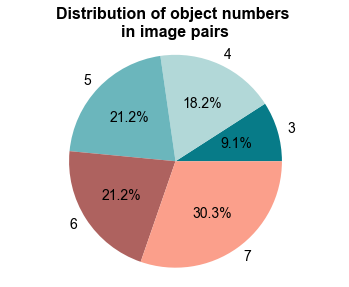

In [45]:
#plot the distribution of object numbers displayed in the images in the sample data
total = sum(list(count_['# occurences']))
_3 = list(count_['# occurences'])[0]/total
_4 = list(count_['# occurences'])[1]/total
_5 = list(count_['# occurences'])[2]/total
_6 = list(count_['# occurences'])[3]/total
_7 = list(count_['# occurences'])[4]/total

color = ['#077B88', '#b2d8d8','#6BB6BC', '#ae625f','#FB9F8B','pink']


percentage_ = [_3, _4, _5,_6,_7]
labels = ['3', '4', '5', '6','7']
plt.pie(percentage_,labels=labels, autopct='%1.1f%%',colors=color, textprops=axis_font)
plt.title('Distribution of object numbers \nin image pairs', **axis_font_title)
plt.subplots_adjust(top=0.95)
plt.axis('equal')
plt.savefig('results/visuals/shares_num_objects.png',bbox_inches='tight')
plt.show()



In [46]:
df_summary=df.groupby('change type').mean()
df_summary.drop('room ID',axis=1).drop('# objects in image',axis=1)

,seconds needed,minutes needed,# turns,# utterances
change type,,,,
attribute change,642.442697,10.481571,10.571429,17.857143
position change,916.608097,15.066125,10.875000,18.750000
same image,553.967872,9.050833,11.000000,16.777778


In [47]:

df_summary.drop(['seconds needed','room ID'],axis=1)

,minutes needed,# turns,# utterances,# objects in image
change type,,,,
attribute change,10.481571,10.571429,17.857143,5.000000
position change,15.066125,10.875000,18.750000,6.000000
same image,9.050833,11.000000,16.777778,5.388889


In [48]:
dict_small={'minutes needed':mins_needed,'room ID':room_,'# turns': count_turns_,'change type':change_type, '# objects in image':num_objects}
df_small = pd.DataFrame(dict_small)
groups = df_small.groupby('change type')

to_dict_minutes={}
to_dict_turns = {}

avg_minutes_needed = []
avg_turns_needed = []
for name, group in groups: 
    to_dict_minutes[name]= list(group['minutes needed'])
    to_dict_turns[name]= list(group['# turns'])
    avg_minutes_needed.append(group.mean()['minutes needed'])
    avg_turns_needed.append(group.mean()['# turns'])
    
    
all_minutes_change_type = pd.DataFrame(dict([ (k,pd.Series(v)) for k,v in to_dict_minutes.items() ]))
all_turns_change_type = pd.DataFrame(dict([ (k,pd.Series(v)) for k,v in to_dict_turns.items()]))

(array([1, 2, 3]),
 [Text(1, 0, 'attribute change'),
  Text(2, 0, 'position change'),
  Text(3, 0, 'same image')])

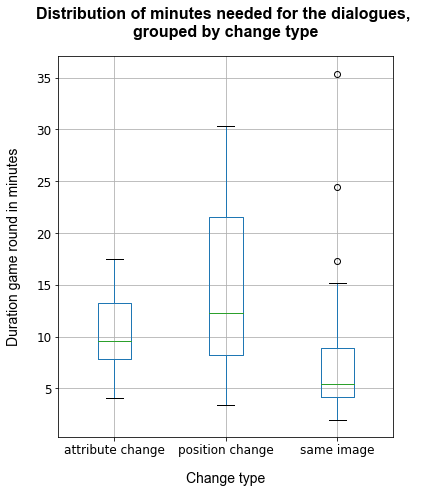

In [49]:
all_minutes_change_type.boxplot(return_type='axes',figsize=(6,7))
plt.title('Distribution of minutes needed for the dialogues, \ngrouped by change type', **axis_font_title, pad=20)
plt.xlabel("Change type",**axis_font, labelpad=15)
plt.ylabel("Duration game round in minutes", **axis_font, labelpad=15)
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
#plt.savefig('results/visuals/minutes_needed_change_type_grouping.png',bbox_inches='tight')



(array([1, 2, 3]),
 [Text(1, 0, 'attribute change'),
  Text(2, 0, 'position change'),
  Text(3, 0, 'same image')])

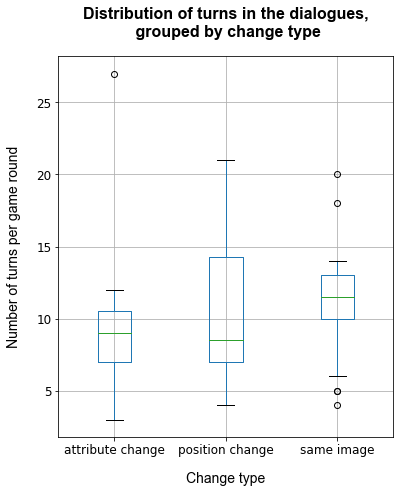

In [50]:
all_turns_change_type.boxplot(return_type='axes', figsize=(6,7))
plt.title('Distribution of turns in the dialogues,\n grouped by change type', **axis_font_title, pad=20)
plt.xlabel("Change type",**axis_font, labelpad=15)
plt.ylabel("Number of turns per game round", **axis_font, labelpad=15)
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
#plt.savefig('results/visuals/turns_needed_change_type_grouping.png',bbox_inches='tight')


In [51]:
groups = df_small.groupby('# objects in image')
index = []
to_dict_minutes={}
to_dict_turns = {}
avg_minutes_needed = []
avg_turns_needed = []
for name, group in groups: 
    index.append(name)
    avg_minutes_needed.append(round(group.mean()['minutes needed'],3))
    avg_turns_needed.append(round(group.mean()['# turns'],3))
    to_dict_minutes[name]= list(group['minutes needed'])
    to_dict_turns[name]= list(group['# turns'])
    
    
avg_obj_num_dict = {'average minutes needed':avg_minutes_needed, 'average turns needed': avg_turns_needed}
avg_by_obj_num = pd.DataFrame(avg_obj_num_dict, index=index)
avg_by_obj_num

,average minutes needed,average turns needed
3,5.207,6.667
4,9.104,9.667
5,10.475,7.857
6,15.453,12.714
7,10.507,13.700


In [52]:
all_minutes_object_num = pd.DataFrame(dict([ (k,pd.Series(v)) for k,v in to_dict_minutes.items() ]))
all_turns_object_num = pd.DataFrame(dict([ (k,pd.Series(v)) for k,v in to_dict_turns.items()]))

(array([1, 2, 3, 4, 5]),
 [Text(1, 0, '3'),
  Text(2, 0, '4'),
  Text(3, 0, '5'),
  Text(4, 0, '6'),
  Text(5, 0, '7')])

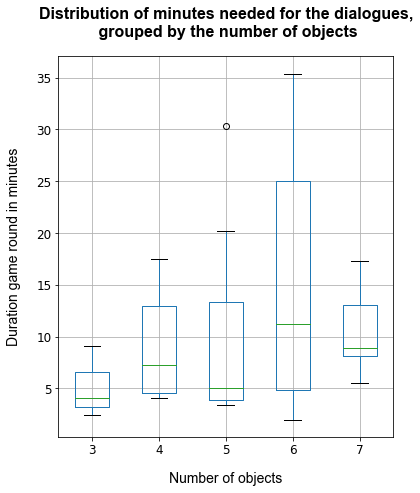

In [53]:
all_minutes_object_num.boxplot(return_type='axes', figsize=(6,7))
#all_minutes_change_type.boxplot(return_type='axes',figsize=(6,7))
plt.title('Distribution of minutes needed for the dialogues,\n grouped by the number of objects', **axis_font_title, pad=20)
plt.xlabel("Number of objects",**axis_font, labelpad=15)
plt.ylabel("Duration game round in minutes", **axis_font, labelpad=15)
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
#plt.savefig('results/visuals/minutes_needed_object_num_grouping.png',bbox_inches='tight')




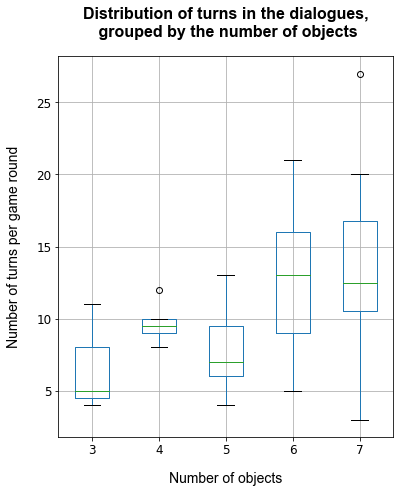

In [54]:
all_turns_object_num.boxplot(return_type='axes',figsize=(6,7))
plt.title('Distribution of turns in the dialogues,\n grouped by the number of objects', **axis_font_title,pad=20)
plt.xlabel("Number of objects",**axis_font, labelpad=15)
plt.ylabel("Number of turns per game round", **axis_font, labelpad=15)
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
#plt.savefig('results/visuals/turns_needed_object_num_grouping.png',bbox_inches='tight')

axis_font = {'fontname':'Arial', 'size':'16'}


In [55]:
groups = df_small.groupby('change type')

names_values = []
for name, group in groups:
    count_objects = group.groupby('# objects in image').count()
    get_items = count_objects['room ID'].to_dict()
    print(type(get_items))
    print(get_items)
    names_values.append([name, get_items])
    



<class 'dict'>
{4: 4, 5: 1, 7: 2}
<class 'dict'>
{5: 3, 6: 2, 7: 3}
<class 'dict'>
{3: 3, 4: 2, 5: 3, 6: 5, 7: 5}


In [56]:
counts_ = []
names_ = []
for pair in names_values:
    name = pair[0]
    #print(type(sorted(pair[1].items())))
    print(OrderedDict(sorted(pair[1].items())))
    counts_.append(OrderedDict(sorted(pair[1].items())))
    names_.append(name)
    

OrderedDict([(4, 4), (5, 1), (7, 2)])
OrderedDict([(5, 3), (6, 2), (7, 3)])
OrderedDict([(3, 3), (4, 2), (5, 3), (6, 5), (7, 5)])


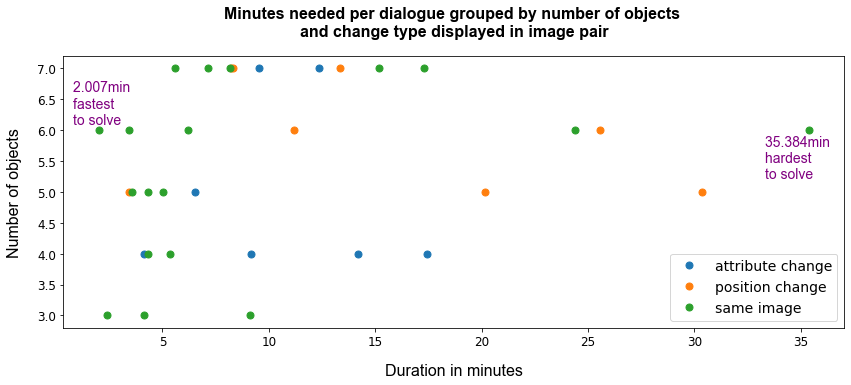

In [60]:
#plot the time needed per dialogue, grouped by the change type and the object number displayed in the images
#mark the dialogue that took longest, and the one with the shortest duration

fig, ax = plt.subplots()
for name, group in groups:
    ax.plot(group['minutes needed'], group['# objects in image'], marker='o', linestyle='', ms=7, label=name)
ax.legend(prop={"size":14})
fig.set_size_inches(14, 5)
plt.xlabel("Duration in minutes",**axis_font, labelpad=15)
plt.ylabel("Number of objects", **axis_font, labelpad=15)

plt.title('Minutes needed per dialogue grouped by number of objects \nand change type displayed in image pair',**axis_font_title, pad=20)
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
axis_font_marker = {'fontname':'Arial', 'size':'14', 'color':'purple'}
plt.annotate("2.007min \nfastest \nto solve", (0.8, 6.1), **axis_font_marker)
plt.annotate("35.384min \nhardest \nto solve", (33.3, 5.22), **axis_font_marker)
#plt.savefig('results/visuals/minutes_by_object_num_and_change_type.png',bbox_inches='tight')

plt.show()

In [151]:
dict_copy={'task formulation':form_type_list,'seconds needed':time_d_in_secs,'time needed':time_,'minutes needed':mins_needed,'room ID':room_,'# turns': count_turns_,'first utterances':first_few_utterances,'change type':change_type, '# objects in image':num_objects}
df_copy = pd.DataFrame(dict_copy)
#df_copy

In [62]:
#find the minimum, average and the maximum amount of time needed to finish a single game round: 
print('minimum amount of time needed:')
print(df_copy['minutes needed'].min())
print()
print('average amount of time needed:')
print(df_copy['minutes needed'].mean())
print()
print('maximum amount of time needed:')
print(df_copy['minutes needed'].max())



minimum amount of time needed:
2.007

average amount of time needed:
10.81257575757576

maximum amount of time needed:
35.384


In [152]:
dict_={'task formulation':form_type_list,'seconds needed':time_d_in_secs,'time needed':time_,'minutes needed':mins_needed,'room ID':room_,'# turns': count_turns_,'first utterances':first_few_utterances,'change type':change_type, '# objects in image':num_objects}
df = pd.DataFrame(dict_)


In [153]:
labels_dict_={'minutes needed':mins_needed,'room ID':room_,'# turns': count_turns_,'change type':change_type,\
              'same or different image': image_same_different,'# objects in image':num_objects, \
              'player 1 label': player_1_command, 'player 2 label': player_2_command, 'players labeled':players_label}
df_labels = pd.DataFrame(labels_dict_)

#check whether the dataframe with the labels looks plausible
df_labels

,minutes needed,room ID,# turns,change type,same or different image,# objects in image,player 1 label,player 2 label,players labeled
0,3.422,176,4,position change,different image,5,no_info,no_info,incorrect
1,7.121,177,12,same image,same image,7,same,same,correct
2,4.113,178,5,same image,same image,3,same,same,correct
3,3.546,179,6,same image,same image,5,same,same,correct
4,9.097,180,4,same image,same image,3,same,same,correct
5,4.115,182,9,attribute change,different image,4,different,different,correct
6,3.447,183,14,same image,same image,6,same,same,correct
7,8.209,184,9,position change,different image,7,same,same,incorrect
8,4.325,185,10,same image,same image,4,same,same,correct
9,2.410,186,11,same image,same image,3,same,same,correct


In [66]:
#drop unnecessatay columns from dataframe -> everything not related to the time needed, the label given by the players, 
# the info whether or not the players labeled correctly
dfs = [x for _, x in df_labels.drop(['# turns','room ID','player 1 label','player 2 label', '# objects in image'],axis=1).groupby('players labeled')]

In [67]:

dfs_correct = [x for _, x in dfs[0].groupby('same or different image')]
same_image_correct = dfs_correct[1]['minutes needed'].mean()
different_image_correct = dfs_correct[0]['minutes needed'].mean()

dfs_incorrect = [x for _, x in dfs[1].groupby('same or different image')]
same_image_incorrect = dfs_incorrect[1]['minutes needed'].mean()
different_image_incorrect = dfs_incorrect[0]['minutes needed'].mean()

same_diff_image_labels_minutes = pd.DataFrame({
    "same image":[ same_image_correct,same_image_incorrect],
    "different image":[different_image_correct,different_image_incorrect]
    }, index=["correctly labeled", "incorrectly labeled"]
)
same_diff_image_labels_minutes.head()

,same image,different image
correctly labeled,9.268176,13.509667
incorrectly labeled,5.356000,10.594667


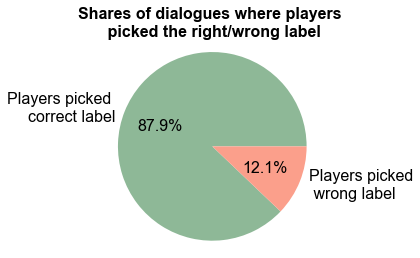

In [68]:
group_by_players_label = df_labels.groupby('players labeled').count()
count_correct_labels = group_by_players_label['room ID']
total = sum(list(count_correct_labels))
correct_ = list(count_correct_labels)[0]/total
incorrect_ = list(count_correct_labels)[1]/total

#'#077B88' - dark cyan
# '#FB9F8B' - salmon
# '#6BB6BC' - grey blue light
# '#b2d8d8' - very bright blue
# '#ae625f' - dark red brown
# '#DD7596' - magenta
# '#4F6272' - anthrazit
# '#B7C3F3' - violet
# '#8EB897' - pastel green


color = ['#077B88', '#DD7596', '#6BB6BC' , '#ae625f', '#FB9F8B' ,'#B7C3F3']
color_true_false = [ '#8EB897', '#FB9F8B']

'#077B88', '#FB9F8B','#6BB6BC','#ae625f','#b2d8d8'
percentage_ = [correct_, incorrect_]
labels = ['Players picked \ncorrect label', 'Players picked\n wrong label']
plt.pie(percentage_,labels=labels,autopct='%1.1f%%', colors=color_true_false, textprops=axis_font)
plt.title('Shares of dialogues where players \n picked the right/wrong label', **axis_font_title)
plt.axis('equal')

plt.rcParams["figure.figsize"] = (5, 5)
#plt.title('Distribution of change types \nin image pairs', **axis_font_title)

plt.subplots_adjust(top=0.85)
#plt.savefig('results/visuals/same_diff_images_labels_picked.png',bbox_inches='tight')

plt.show()

In [69]:
count_correct_labels_c_type = df_labels.groupby(['change type','players labeled']).count()
count_correct_labels_c_type

minutes needed  room ID  # turns  \
change type      players labeled                                     
attribute change correct                       7        7        7   
position change  correct                       5        5        5   
                 incorrect                     3        3        3   
same image       correct                      17       17       17   
                 incorrect                     1        1        1   

                                  same or different image  # objects in image  \
change type      players labeled                                                
attribute change correct                                7                   7   
position change  correct                                5                   5   
                 incorrect                              3                   3   
same image       correct                               17                  17   
                 incorrect                              1                   1   

                                  player 1 label  player 2 label  
change type      players labeled                                  
attribute change correct                       7               7  
position change  correct                       5               5  
                 incorrect                     3               3  
same image       correct                      17              17  
                 incorrect                     1               1

In [70]:
distribution_correct_incorrect_labels = pd.DataFrame({
    "correctly labeled":[count_correct_labels_c_type['room ID'][0],count_correct_labels_c_type['room ID'][1], count_correct_labels_c_type['room ID'][3]],
    "incorrectly labeled":[0,count_correct_labels_c_type['room ID'][2],count_correct_labels_c_type['room ID'][4]]
    }, index=["attribute change", "position change", "same image"]
)
distribution_correct_incorrect_labels.head()

,correctly labeled,incorrectly labeled
attribute change,7,0
position change,5,3
same image,17,1


Text(0, 0.5, 'Percentage correctly/\nincorrectly labeled')

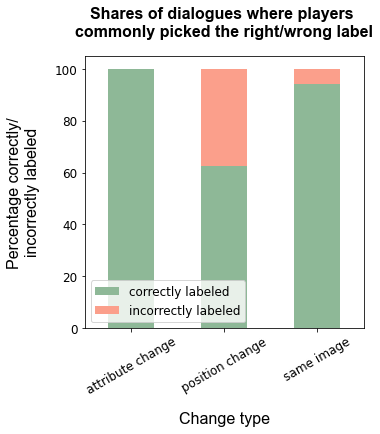

In [71]:
# plot the distribution of dialogues where players picked the correct/incorrect label,
#grouped by the change the change type displayed in the images
stacked_data = distribution_correct_incorrect_labels.apply(lambda x: x*100/sum(x), axis=1)
display_ = stacked_data.plot(kind="bar", stacked=True, color = color_true_false)

plt.rcParams["figure.figsize"] = (5, 7)
plt.title('Shares of dialogues where players \ncommonly picked the right/wrong label', **axis_font_title, pad=20)
plt.xlabel("Change type",**axis_font, labelpad=15)
plt.legend(loc='lower left',prop={'size': 12})
plt.xticks(fontsize=12,rotation=30)
plt.yticks(fontsize=12)
plt.ylabel("Percentage correctly/\nincorrectly labeled",**axis_font, labelpad=15)
#plt.savefig('results/visuals/change_type_labels_picked.png',bbox_inches='tight')

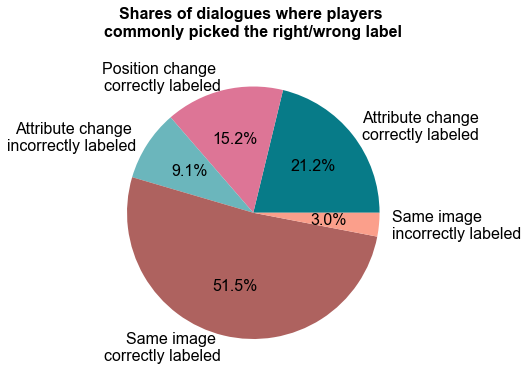

In [72]:
#plot the distribution of correctly and incorrectly labeled image pairs, 
# grouped by the change type
total = sum(list(count_correct_labels_c_type['room ID']))
correct_attri_change = list(count_correct_labels_c_type['room ID'])[0]/total
correct_pos_change= list(count_correct_labels_c_type['room ID'])[1]/total
incorrect_pos_change =list(count_correct_labels_c_type['room ID'])[2]/total
correct_same_i = list(count_correct_labels_c_type['room ID'])[3]/total
incorrect_same_i = list(count_correct_labels_c_type['room ID'])[4]/total

percentage_ = [correct_attri_change, correct_pos_change,incorrect_pos_change,correct_same_i,incorrect_same_i]
labels = ['Attribute change \ncorrectly labeled','Position change \ncorrectly labeled', \
          'Attribute change \nincorrectly labeled', 'Same image \ncorrectly labeled', 'Same image \nincorrectly labeled']
plt.pie(percentage_,labels=labels,autopct='%1.1f%%', textprops=axis_font, colors=color)
plt.title('Shares of dialogues where players \ncommonly picked the right/wrong label',**axis_font_title)
plt.axis('equal')
plt.subplots_adjust(top=0.8)
#plt.savefig('results/visuals/change_type_pie_chart_labels_picked.png',bbox_inches='tight')
plt.show()

In [155]:
count_correct_labels_same_dif_image = df_labels.groupby(['same or different image','players labeled']).count()
correct_incorrect_labels = count_correct_labels_same_dif_image['room ID']


In [74]:
#show the numbers of correctly and incorrectly labeled image pairs, grouped by the pairs of different/identical images
same_diff_image_correct_incorrect_labels = pd.DataFrame({
    "correctly labeled":[correct_incorrect_labels[0], correct_incorrect_labels[2]],
    "incorrectly labeled":[correct_incorrect_labels[1],correct_incorrect_labels[3]]
    }, index=["different image", "same image"]
)
same_diff_image_correct_incorrect_labels.head()

,correctly labeled,incorrectly labeled
different image,12,3
same image,17,1


Text(0, 0.5, 'Percentage correctly/\nincorrectly labeled')

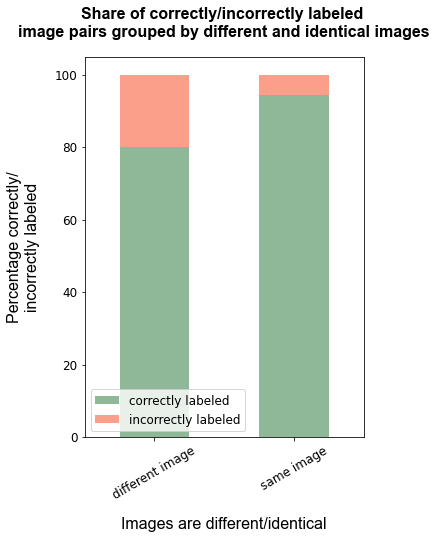

In [75]:
#plot the share of correctly/incorrectly labeled image pairs in the sample data, grouped by the image pairs showing
# identical/different images
stacked_data = same_diff_image_correct_incorrect_labels.apply(lambda x: x*100/sum(x), axis=1)
stacked_data.plot(kind="bar", stacked=True, color=color_true_false)
plt.title("Share of correctly/incorrectly labeled \nimage pairs grouped by different and identical images", **axis_font_title, pad=20)

plt.xlabel("Images are different/identical", **axis_font, labelpad=15)
plt.legend(loc='lower left',prop={'size': 12})
plt.xticks(fontsize=12,rotation=30)
plt.yticks(fontsize=12)
plt.ylabel("Percentage correctly/\nincorrectly labeled", **axis_font, labelpad=15)
#plt.savefig('results/visuals/same_diff_image_labels_picked.png',bbox_inches='tight')

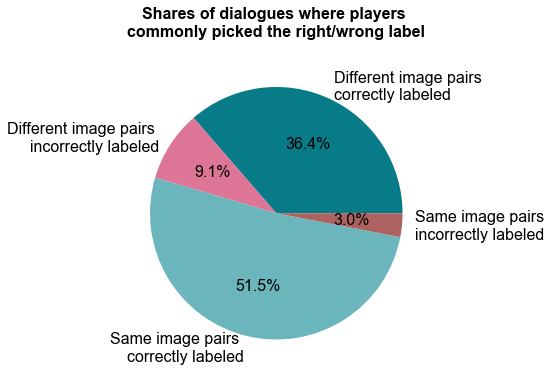

In [76]:

total = sum(list(correct_incorrect_labels))
different_image_correct = list(correct_incorrect_labels)[0]/total
different_image_incorrect= list(correct_incorrect_labels)[1]/total
same_image_correct =list(correct_incorrect_labels)[2]/total
same_image_incorrect = list(correct_incorrect_labels)[3]/total



percentage_ = [different_image_correct, different_image_incorrect,same_image_correct,same_image_incorrect]
labels = ['Different image pairs \ncorrectly labeled','Different image pairs \nincorrectly labeled', \
          'Same image pairs \ncorrectly labeled', 'Same image pairs\nincorrectly labeled']
plt.pie(percentage_,labels=labels,autopct='%1.1f%%',textprops=axis_font, colors=color)
plt.title('Shares of dialogues where players \ncommonly picked the right/wrong label',**axis_font_title)
plt.rcParams["figure.figsize"] = (5, 5)
plt.subplots_adjust(top=0.8)

plt.axis('equal')
#plt.savefig('results/visuals/same_diff_pie_labels_picked.png',bbox_inches='tight')
plt.show()


In [154]:
count_change_types = df.groupby('change type').count()


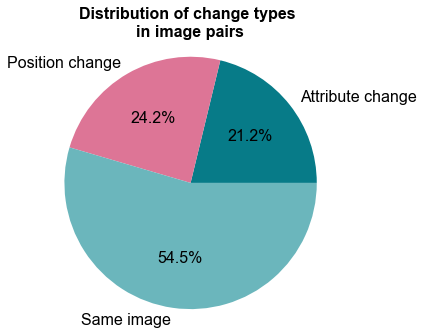

In [78]:
#plot the share of change types in the sample data
count_change_t = count_change_types['task formulation']
total = sum(list(count_change_t))

attri_change = list(count_change_t)[0]/total
pos_change = list(count_change_t)[1]/total
same_image = list(count_change_t)[2]/total

percentage_ = [attri_change, pos_change, same_image]
labels = ['Attribute change', 'Position change', 'Same image']
plt.pie(percentage_,labels=labels,autopct='%1.1f%%',textprops=axis_font, colors = color)
plt.rcParams["figure.figsize"] = (5, 5)
plt.title('Distribution of change types \nin image pairs', **axis_font_title)

plt.subplots_adjust(top=0.9)

plt.axis('equal')
#plt.savefig('results/visuals/distri_change_type_pie_.png',bbox_inches='tight')
plt.show()

In [79]:
def count_utt_token_bef_answer_proposals(bef_first_,bef_last_):
    ''' method to count the utterances or tokens between a first and a last agreement/answer proposal
        return:  diff__first_second - list of utterances or tokens between a first and a last answer proposal
                                        (if there are no proposals, the entry is 'no discussion about proposal')
                number__bef_first_answer - list of utterances or tokens before a first answer proposal (if there is no answer
                            proposal in the dialogue, the list entry is 'no answer proposal')
                number__bef_last_answer - list of utterances or tokens before a last answer proposal (if there is no answer
                            proposal in the dialogue, the list entry is 'no answer proposal')

        args: bef_first_ - list of utterances or tokens before a first answer proposal (if there is no answer
                            proposal in the dialogue, the list entry is '0')
                bef_last_- list of utterances or tokens before a last answer proposal (if there is no answer
                            proposal in the dialogue, the list entry is '0')

            '''  
    
    diff__first_second,number__bef_first_answer,number__bef_last_answer = [],[],[]
    for i in range(len(bef_first_)):
        if bef_last_[i]!=0:
            diff_=bef_last_[i]-bef_first_[i]
        else:
            diff_='no discussion about proposal'
        diff__first_second.append(diff_)

    for e in bef_first_:
        if e==0:
            number__bef_first_answer.append('no answer proposal')
        else:
            number__bef_first_answer.append(e)

    for i in bef_last_:
        if i==0:
            number__bef_last_answer.append('no answer proposal')
        else:
            number__bef_last_answer.append(i)
            
    return diff__first_second, number__bef_first_answer,number__bef_last_answer
    
    

In [80]:
#manually label which dialogues are active and passive - 0 for passive, 1 for active
a_p = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
len(a_p)
active_passive = []
for e in a_p:
    if e==0:
        active_passive.append('passive')
    else:
        active_passive.append('active')
        
#manually set numbers for utterances before a first and a final agreement proposal was made     
utt_bef_first = [0,18,6,0,7, 10,0,0,0,0,14,5,19,7, 32,19,12,13,6,17,10,0,0, 7,0,23,0,21,20,0,0,0,0]
utt_bef_last=[ 0,0, 0,0,0, 16,0,0,0,0,0,37,0 ,0, 34,0 ,0, 0 ,13,0,0 ,0,0, 0,0,0 ,0,0 ,0 ,0,0,0,0]


diff_utt_first_second, number_utt_bef_first_answer,\
number_utt_bef_last_answer = count_utt_token_bef_answer_proposals(utt_bef_first,utt_bef_last)

#manually set numbers for turns before a first and a final agreement proposal was made      
turns_bef_first = [0,10,4,0,4,4,0,0,0,0,10,4,12,4,21,15,7,7,4,11,5,0,0,3,0,19,0,12,13,0,0,0,0]
turns_bef_last =[0,0 ,0,0,0,8,0,0,0,0,0,26,0 ,0,21,0 ,0,0,9, 0,0,0,0,0,0, 0,0, 0, 0,0,0,0,0]

diff_turns_first_last,number_turns_bef_first_answer,\
number_turns_bef_last_answer = count_utt_token_bef_answer_proposals(turns_bef_first,turns_bef_last)


exp_ag = [0,1,1,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0]
        
explicit_agreement=transform_0_1_yes_no_list(exp_ag)


In [82]:
#number_turns_bef_first_answer
dict_dialog_eval={'room':room_, '# turns':count_turns_,'change type':change_type,\
                  'same/different image':image_same_different, 'player 1 label':player_1_command, \
                  'player 2 label':player_2_command, 'players labeled':players_label,\
                  'active or passive dialogue':active_passive,\
                  '# turns before first answer proposal':number_turns_bef_first_answer,\
    '# turns before last answer proposal':number_turns_bef_last_answer,\
    '# turns between first and last answer proposal':diff_turns_first_last, \
                  '# utterances before first answer proposal':number_utt_bef_first_answer,\
                  '# utterances before last answer proposal':number_utt_bef_last_answer,\
                  '# utterances between first and last answer proposal':diff_utt_first_second,\
                  'explicit agreement on seeing an identical/different image':explicit_agreement }
df_dialog_eval = pd.DataFrame(dict_dialog_eval)
df_dialog_eval

,room,# turns,change type,same/different image,player 1 label,player 2 label,players labeled,active or passive dialogue,# turns before first answer proposal,# turns before last answer proposal,# turns between first and last answer proposal,# utterances before first answer proposal,# utterances before last answer proposal,# utterances between first and last answer proposal,explicit agreement on seeing an identical/different image
0,176,4,position change,different image,no_info,no_info,incorrect,passive,no answer proposal,no answer proposal,no discussion about proposal,no answer proposal,no answer proposal,no discussion about proposal,no
1,177,12,same image,same image,same,same,correct,passive,10,no answer proposal,no discussion about proposal,18,no answer proposal,no discussion about proposal,yes
2,178,5,same image,same image,same,same,correct,passive,4,no answer proposal,no discussion about proposal,6,no answer proposal,no discussion about proposal,yes
3,179,6,same image,same image,same,same,correct,passive,no answer proposal,no answer proposal,no discussion about proposal,no answer proposal,no answer proposal,no discussion about proposal,no
4,180,4,same image,same image,same,same,correct,passive,4,no answer proposal,no discussion about proposal,7,no answer proposal,no discussion about proposal,no
5,182,9,attribute change,different image,different,different,correct,passive,4,8,4,10,16,6,yes
6,183,14,same image,same image,same,same,correct,passive,no answer proposal,no answer proposal,no discussion about proposal,no answer proposal,no answer proposal,no discussion about proposal,no
7,184,9,position change,different image,same,same,incorrect,passive,no answer proposal,no answer proposal,no discussion about proposal,no answer proposal,no answer proposal,no discussion about proposal,no
8,185,10,same image,same image,same,same,correct,passive,no answer proposal,no answer proposal,no discussion about proposal,no answer proposal,no answer proposal,no discussion about proposal,no
9,186,11,same image,same image,same,same,correct,passive,no answer proposal,no answer proposal,no discussion about proposal,no answer proposal,no answer proposal,no discussion about proposal,no


In [83]:

last_answer_proposal = ['','', '','','', 'on the left side I see a purple big cylinder', '','','','','',\
'Okay, then the difference is the color of the red/ orange cube','','','And small blue cylinder is on a different place',\
'','','','ah, that is completely different. I see a big grey cylinder','','','','','','','same', '',\
'other user : I think we see the same','','','','','' ]

In [85]:

first_answer_proposal = ['', 'I guess we see the same image','same image?', '','same','then, one difference is the ball that you have',\
     '','','','','I think we see the same image','I think it\'s the same picture', 'then it is the same',\
    'That\'s a difference then' ,'Ok, so definitely different', 'ok, then I think we see the same image',\
                         'then, this is a difference','then this is the difference',\
    'then this is /different. three red and one grey','than this is the difference','so, the position is different',\
    '','','there is no purple cube. this is /different','','I would say, we see the same','' ,\
    'I think we\'re seeing the same picture', 'then, this is the difference', '','','','' ]

In [86]:
#entire_command_sent
cleaned_commands=[]
for elem in entire_command_sent:
    return_cleaned_elem = list(set(elem))
    cleaned_commands.append(return_cleaned_elem)

In [87]:
#number_turns_bef_first_answer
dict_dialog_eval={'room':room_, '# turns':count_turns_,'change type':change_type,\
                  'same/different image':image_same_different, 'players labeled':players_label,\
                  'active or passive dialogue':active_passive,\
                  '# turns before first answer proposal':number_turns_bef_first_answer,\
    '# turns before last answer proposal':number_turns_bef_last_answer,\
    '# turns between first and last answer proposal':diff_turns_first_last,\
                  'explicit agreement on seeing an identical/different image':explicit_agreement,\
                  'first answer proposal':first_answer_proposal, 'last answer proposal':last_answer_proposal,'commands': cleaned_commands}
df_dialog_eval = pd.DataFrame(dict_dialog_eval)
df_dialog_eval

,room,# turns,change type,same/different image,players labeled,active or passive dialogue,# turns before first answer proposal,# turns before last answer proposal,# turns between first and last answer proposal,explicit agreement on seeing an identical/different image,first answer proposal,last answer proposal,commands
0,176,4,position change,different image,incorrect,passive,no answer proposal,no answer proposal,no discussion about proposal,no,,,[no_info]
1,177,12,same image,same image,correct,passive,10,no answer proposal,no discussion about proposal,yes,I guess we see the same image,,[same]
2,178,5,same image,same image,correct,passive,4,no answer proposal,no discussion about proposal,yes,same image?,,[same]
3,179,6,same image,same image,correct,passive,no answer proposal,no answer proposal,no discussion about proposal,no,,,[same]
4,180,4,same image,same image,correct,passive,4,no answer proposal,no discussion about proposal,no,same,,[same]
5,182,9,attribute change,different image,correct,passive,4,8,4,yes,"then, one difference is the ball that you have",on the left side I see a purple big cylinder,"[different green ball on the left, different, ..."
6,183,14,same image,same image,correct,passive,no answer proposal,no answer proposal,no discussion about proposal,no,,,"[done, same]"
7,184,9,position change,different image,incorrect,passive,no answer proposal,no answer proposal,no discussion about proposal,no,,,[same]
8,185,10,same image,same image,correct,passive,no answer proposal,no answer proposal,no discussion about proposal,no,,,[same]
9,186,11,same image,same image,correct,passive,no answer proposal,no answer proposal,no discussion about proposal,no,,,[same]


In [88]:
df_active_passive = df_dialog_eval.copy()
df_active_passive.groupby('active or passive dialogue').count()['room']


active or passive dialogue
passive    33
Name: room, dtype: int64

In [89]:
df_commands_different = df_dialog_eval.copy()

df_commands_different

,room,# turns,change type,same/different image,players labeled,active or passive dialogue,# turns before first answer proposal,# turns before last answer proposal,# turns between first and last answer proposal,explicit agreement on seeing an identical/different image,first answer proposal,last answer proposal,commands
0,176,4,position change,different image,incorrect,passive,no answer proposal,no answer proposal,no discussion about proposal,no,,,[no_info]
1,177,12,same image,same image,correct,passive,10,no answer proposal,no discussion about proposal,yes,I guess we see the same image,,[same]
2,178,5,same image,same image,correct,passive,4,no answer proposal,no discussion about proposal,yes,same image?,,[same]
3,179,6,same image,same image,correct,passive,no answer proposal,no answer proposal,no discussion about proposal,no,,,[same]
4,180,4,same image,same image,correct,passive,4,no answer proposal,no discussion about proposal,no,same,,[same]
5,182,9,attribute change,different image,correct,passive,4,8,4,yes,"then, one difference is the ball that you have",on the left side I see a purple big cylinder,"[different green ball on the left, different, ..."
6,183,14,same image,same image,correct,passive,no answer proposal,no answer proposal,no discussion about proposal,no,,,"[done, same]"
7,184,9,position change,different image,incorrect,passive,no answer proposal,no answer proposal,no discussion about proposal,no,,,[same]
8,185,10,same image,same image,correct,passive,no answer proposal,no answer proposal,no discussion about proposal,no,,,[same]
9,186,11,same image,same image,correct,passive,no answer proposal,no answer proposal,no discussion about proposal,no,,,[same]


In [90]:
remove_irrelevant_columns = df_commands_different.drop(['# turns before first answer proposal',\
                            '# turns before last answer proposal','# turns between first and last answer proposal',\
                           'explicit agreement on seeing an identical/different image'],axis=1)

In [91]:
#examine hypothesis whether the difference descriptions are different, due to the different player views
remove_irrelevant_columns.drop(remove_irrelevant_columns[(remove_irrelevant_columns['same/different image']=='same image') & 
                                                (remove_irrelevant_columns['players labeled']=='correct')].index, inplace=True)


remove_irrelevant_columns.drop(remove_irrelevant_columns[remove_irrelevant_columns['players labeled']=='incorrect'].index, inplace=True)

In [92]:
remove_irrelevant_columns

,room,# turns,change type,same/different image,players labeled,active or passive dialogue,first answer proposal,last answer proposal,commands
5,182,9,attribute change,different image,correct,passive,"then, one difference is the ball that you have",on the left side I see a purple big cylinder,"[different green ball on the left, different, ..."
11,188,27,attribute change,different image,correct,passive,I think it's the same picture,"Okay, then the difference is the color of the ...",[different red cube and brown cube are differe...
13,190,18,position change,different image,correct,passive,That's a difference then,,[different so the difference is in two objects...
14,191,21,position change,different image,correct,passive,"Ok, so definitely different",And small blue cylinder is on a different place,[different side of the shiny gren cylinder and...
16,194,8,position change,different image,correct,passive,"then, this is a difference",,[different is that the gray ball is behind the...
17,195,8,attribute change,different image,correct,passive,then this is the difference,,"[different cyan shiny cylinder, different is r..."
18,196,9,attribute change,different image,correct,passive,then this is /different. three red and one grey,"ah, that is completely different. I see a big ...","[different is the red cube, different grey cyl..."
19,197,12,attribute change,different image,correct,passive,than this is the difference,,"[different big grey ball on the right, differe..."
20,198,7,position change,different image,correct,passive,"so, the position is different",,"[different position of bright blue cylinder, d..."
23,201,3,attribute change,different image,correct,passive,there is no purple cube. this is /different,,"[different purple cube, read, different is the..."


In [93]:
rooms = remove_irrelevant_columns['room']
only_commands = remove_irrelevant_columns['commands']


In [95]:
remove_words = ['different', '**ready**','ready','ready ','read']
for commands_ in only_commands:
    for single_command in commands_:
        if single_command in remove_words:
            commands_.remove(single_command)
            

combi = pd.concat([rooms, only_commands],axis=1)
combi.style.set_properties(subset=['commands'], **{'width': '800px'})

,room,commands
5,182,"['different green ball on the left', 'different no green ball']"
11,188,"['different red cube and brown cube are different', '**ready**', 'different ok, then those two objects is the difference', 'different those two objects is the difference']"
13,190,"['different so the difference is in two objects on the left', 'different golden cube is on the right side not on left side']"
14,191,"['different side of the shiny gren cylinder and yellow cube is cylinder', 'different green cylinder on other side, small blue cylinder on a different place ']"
16,194,"['different is that the gray ball is behind the red cube', 'different position of red cube']"
17,195,"['different cyan shiny cylinder', 'different is red cube at the right site ']"
18,196,"['different is the red cube', 'different grey cylinder at the bottom']"
19,197,"['different big grey ball on the right', 'different is the blue cyl']"
20,198,"['different position of bright blue cylinder', 'different is the position of the light blue cylinder']"
23,201,"['different purple cube', 'different is the purple cube']"


Room 176
pleasant sees :  


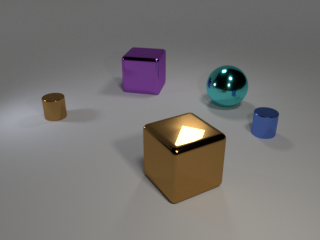

crooked sees : 


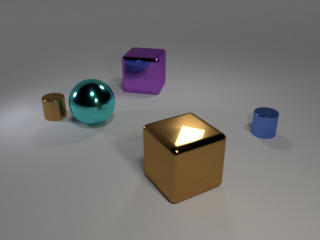

pleasant : ready
crooked : I see five objects
pleasant : yes
crooked : two cubes and two cylinders, one ball
pleasant : yes
pleasant : one cube in front, and one on the back

Room 177
itchy sees :  


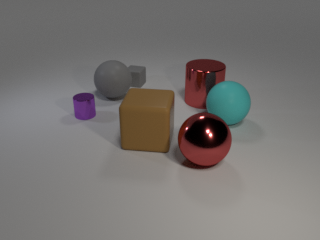

gentle sees : 


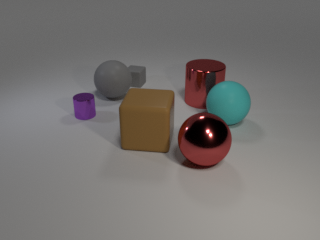

itchy : I see seven objects
itchy : three balls, two cubes and two cylinders
gentle : two of those are metallic red, 1 cyan, 2 grey, one lilac and one beige
itchy : yes, same here. 
itchy : a metallic red ball at front, more on the right
itchy : and in one line with that a metallic red cylinder in the back
gentle : the object extending to the right is a cyan ball followed by the red cylinder, redball
gentle : furthest
itchy : yup, agree
itchy : closest to the center is a beige big cube
gentle : same here 
itchy : and a tiny metallic lila cylinder on the left?
gentle : the greyball and cube are the farstest away
gentle : yeah
itchy : agree with the grey objects too
itchy : they are close to the center, but a little more to the left
gentle : is the exact distance imporant?
itchy : no,don't think so
itchy : I guess we see the same image
gentle : I think so too
itchy : cool!

Room 178
other user sees :  


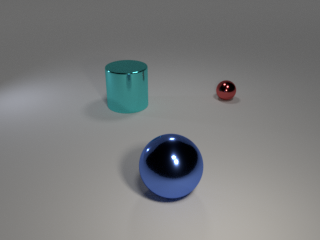

barren sees : 


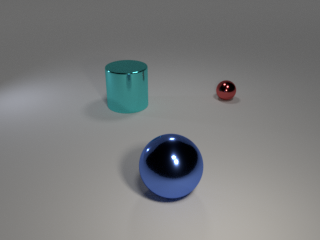

barren : two balls, one cylinder
other user : one red ball on the right and background the cyan coloured cylinder is on the left in the back and the blue ball in the front all are metallic 
barren : yes, agree!
barren : the red ball in the back is rather small
barren : the one in front is big
other user : yes
barren : same image?
other user : the blue ball is the same size as the cylinder I'd guess
other user : yes

Room 179
merciful sees :  


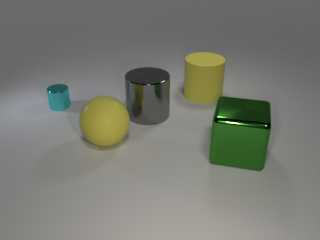

pleasant sees : 


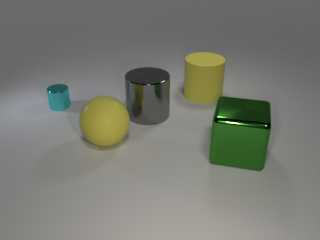

merciful : five objects
merciful : two yellow, one cyan metallic
merciful : one grey metallic and one green metallic
pleasant : from the right to left metallc green cube, light yellow cylinder, metallic grey cylinder, light yellow ball and metallc cyan cylinder (small)
merciful : yup
pleasant : all other objects are roughtly the same size
merciful : yes, agree
merciful : the yellow cylinder is in the back
pleasant : front to back is green, yellow, grey, cyan, and yellow
merciful : not sharply, but yes
merciful : kind of overlapping

Room 180
great sees :  


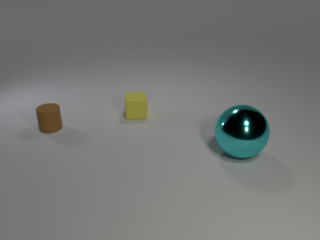

hollow sees : 


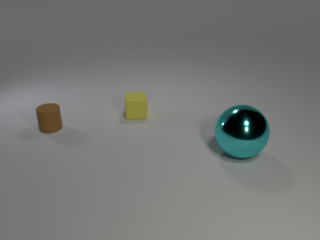

great : three objects. 
great : right to left: cyan metallic ball, yellow cube, beige cylinder
hollow : yes
great : the ball is big, the other two small
hollow : comparatively, sure
hollow : the ball is slightly to the front followed by the cylinder and then the cube
great : yes
great : same

Room 182
screeching sees :  


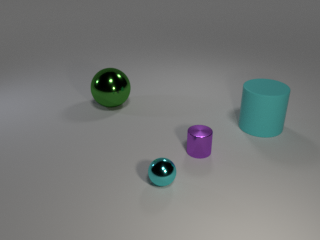

joyful sees : 


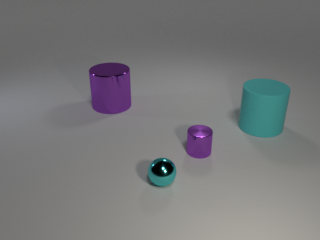

joyful : four objects
screeching : i see four objects
screeching : two balls
joyful : nope
joyful : one ball
joyful : it is metallic and blue
joyful : in the center, in the front
joyful : and the others are cylinders
screeching : i have green and blue balls
screeching : and two cylinders
joyful : then, one difference is the ball that you have
screeching : so different pictures
joyful : where are the balls in your image?
screeching : front center blue ball
screeching : left side green ball
joyful : on the left side I see a purple big cylinder
joyful : so, that is different
screeching : yes

Room 183
hollow sees :  


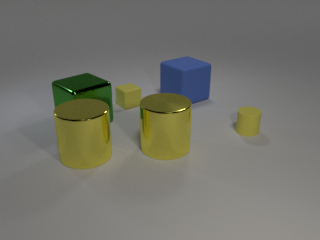

massive sees : 


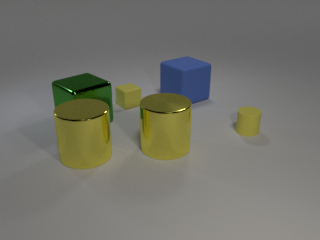

massive : 6 objects
hollow : same
massive : three cubes
hollow : yes
massive : 3 cylinders
hollow : two big golden cylinders
massive : placed in two rows
massive : yes, in front
hollow : yes and yes
massive : another cylinder is not shiny on the right
hollow : yes, it is yellow
hollow : the cubes are left to right:
hollow : big, green, shiny, 
massive : green metalic, yellow and blue
hollow : well, yes
hollow : and the yellow one is small
massive : yup
hollow : and kind of behind the other two?
hollow : but nearly in one line
massive : not really
massive : yeah, one line

Room 184
combative sees :  


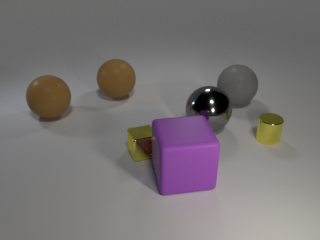

bumpy sees : 


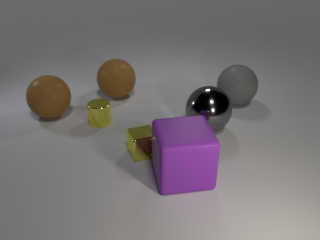

bumpy : seven objects
bumpy : two brown balls in the back, to the lef
bumpy : to the left
combative : yes
combative : two cubes in front
bumpy : yes, one big purple and one golden small
combative : shiny gold behind and purple in front
combative : then two more ball on the right
bumpy : yes, behind on the left
combative : metallic and grey to the right
bumpy : yes, two more balls on the right
bumpy : exactly
bumpy : and one golden small shiny cylinder 
bumpy : between the brown balls
bumpy : or a bit in front of them 
combative : well cylinder yes, but more like diagonally from them
bumpy : yes, they are forming a triangle
combative : correct

Room 185
itchy sees :  


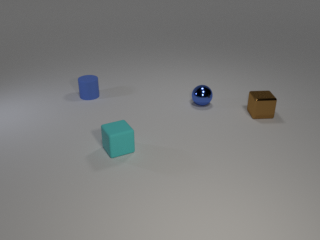

lush sees : 


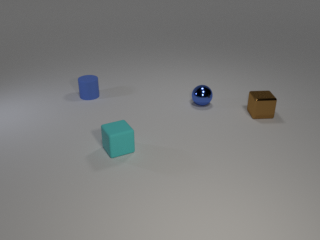

lush : 4 objects
lush : two cubes
itchy : left to right
lush : one blue metallic ball
itchy : one blue cylinder
lush : yes
itchy : one bright blue cube
itchy : metallic blue ball
itchy : brown shiny cube
lush : yup
itchy : three object are kind of in one line
lush : yes
itchy : only the bright blue cube is not
itchy : it is in front
lush : yes

Room 186
affectionate sees :  


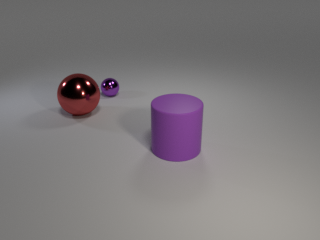

ugly sees : 


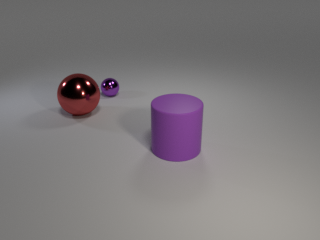

affectionate : three objects
ugly : 3 objects
affectionate : left to right: big red shiny ball
ugly : two shiny balls
affectionate : yes
ugly : and cylinder right
ugly : it is purple
affectionate : well, I see the cylinder in the middle
affectionate : yes, and big
ugly : yes
affectionate : the red ball is big, the purple one small
ugly : little ball is purple too
affectionate : and shiny
ugly : yes

Room 187
other user sees :  


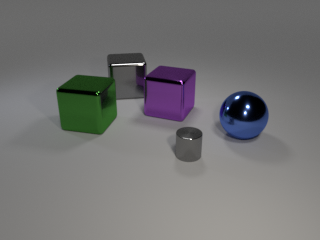

graceful sees : 


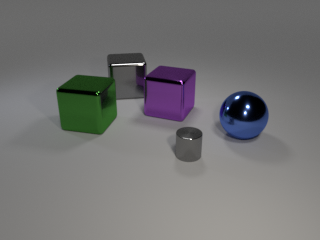

other user : I see five objects
graceful : Me too
graceful : 3 cubes to the left, a sphere at the very right, a cylinder closest to the bottom
other user : agree
graceful : Colors, from left to right: green, silver, purple, silver, blue
other user : yup
graceful : I can see 3 distinct groups:
other user : the cubes and the sphere are big complared to the cylinder
graceful : 3 cubes to the left, a cylinder to the bottom, a sphere to the right
graceful : Agree to the cylinder looking smaller than any of the other objects
other user : yes, but the groups are quite close
graceful : Yes
graceful : Kind of in the middle of the screen
other user : yes.
other user : I think we see the same image
graceful : The edges of all objects are rounded
graceful : I agree
other user : ok
graceful : Do we vote?

Room 188
wide sees :  


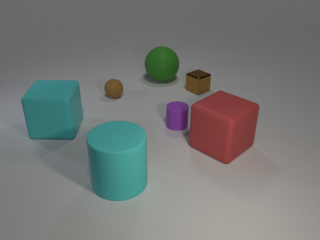

calm sees : 


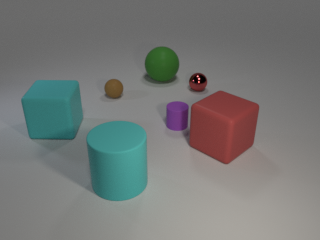

wide : Ready
calm : so, I see 7 objects on the picture
wide : Me too, 7 objects 
calm : two cubes, blue and red
wide : 2 light blue ones, one purple, one red, 2 Brown, and one green 
wide : I think it's the same picture 
calm : the red one is shiny little ball?
calm : on the right side
wide : Oh no
wide : I have a red cube 
wide : And that's the only red object 
calm : ok
wide : I have a small shiny brown ball
calm : alright
calm : lets go from left to right
wide : Light blue cube 
calm : on the left, there is light blue big cube
wide : Same 
calm : then, little brown ball and beneath light blue big cylinder
wide : Beneath that I have a light blue big cylinder
wide : Same
calm : great
wide : Middle sized green ball
wide : And small purple cylinder
calm : yes
wide : Little brown cube
wide : And big red cube
calm : next to the purple cylinder I have big orange cube
calm : yeah, kind of reddish orange
wide : Nah, it's definitely red red for me
calm : is your brown cube shiny?
wide : Do yo

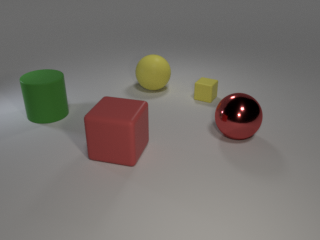

deep sees : 


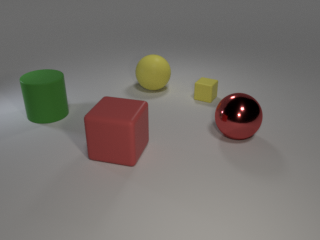

merry : 5 objects
deep : 5 objects
deep : From left bottom to right top
deep : Green cube big
merry : yes
deep : I mean cylinder 
deep : Sorry
merry : wait
merry : I have big green cylinder
merry : ah ok
deep : Yeah, me too 
deep : Then I have a big red cube 
merry : yup
deep : At the very top a middle sized yellow ball
merry : correct
deep : Right next to it a small yellow box 
merry : yes
deep : And at the very right a middle sized red shiny ball
merry : yeah!
merry : then it is the same

Room 190
greasy sees :  


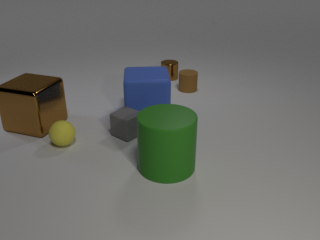

natural sees : 


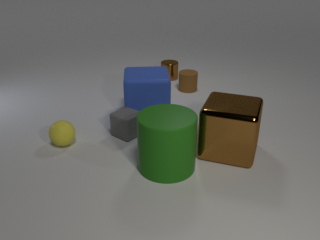

natural : 7 objects
natural : Small yellow ball, not shiny 
greasy : yes
natural : Small grey box, not shiny 
greasy : I mean yes to 7 objects
greasy : but then I have big golden shiny cube on the most left
natural : Yeah? 
natural : That's a difference then 
greasy : and next to it, I have little yellow ball
natural : I have a little yellow ball at the very left 
greasy : hm ok
natural : In the middle I have a small grey cube
greasy : yes
natural : Then a big blue cube behind the gray cube 
greasy : north from it, there is a green cylinder
greasy : yep
greasy : oh, I mean south
natural : I have a green cylinder too
greasy : yes
natural : In front of the other objects
natural : In the back I have two small brown cylinders 
greasy : and then I have two golden cylinders, but only the one on top is shiny
natural : Yeah
natural : Golden brown 
greasy : I guess it's the same
natural : Might be the same color 
natural : And yes, the one on the left is shiny in my picture 

Room 191
icy sees 

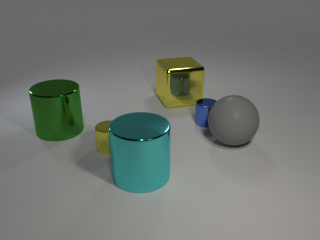

jubilant sees : 


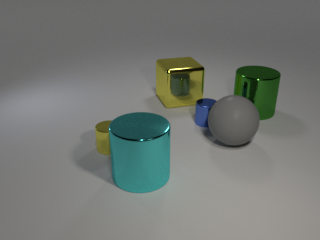

jubilant : 6 obj
icy : 6
icy : 1. Big green shiny cylinder 
jubilant : on the right?
icy : 2. Small yellow shiny cylinder 
icy : On the left 
icy : Always from left two right from bottom top 
jubilant : ok, for me, it's on the right side
jubilant : object 2 is same
icy : 3. Big light blue shiny cylinder 
jubilant : mine is yellow
icy : 4. Big yellow shiny cube 
icy : 3. In the middle? 
jubilant : and it's a cube actually
jubilant : yes
icy : Oh
icy : Ok
icy : 4. Is at the top of the picture 
jubilant : the little blue shiny cylinder
jubilant : *then
icy : You mean 4. ?
jubilant : yes
icy : Okay
jubilant : but it's rather in the middle
icy : I have a little blue shiny cylinder too 
jubilant : 5 is grey ball
icy : I have a gray ball too
icy : But it's 6. For me 
jubilant : and finally green shiny cylinder on the right
icy : It's the last object on the right side
jubilant : the one u had on the left side
icy : Yeah
icy : Ok, so definitely different 
icy : Green cylinder is on different si

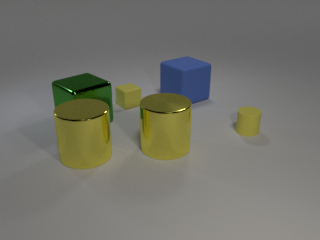

other user sees : 


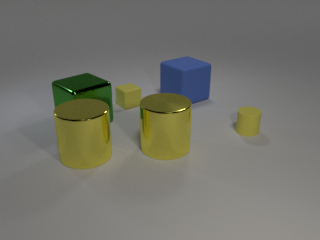

other user : ready
other user : ready
joyful : I see six objects
other user : same
joyful : left to right: 
joyful : a golden cylinder, green cube behind it, yellow cube, golden cylinder, blue cube, yellow cylinder
other user : same
joyful : the golden cylinders in the front are quite big
other user : the two left objects have about the same size
other user : same
joyful : yes
joyful : and I think the blue cube in the back is rather big as well
other user : yes, but a litte bit smaller than the two golden cyl. and the shiny green cube
joyful : mh, could be. or it is the perspective
other user : could be
joyful : the cylinder on the right is small
other user : very small
joyful : about the same size as the yellow cube between the other two cubes
other user : exactly
joyful : ok, then I think we see the same image
other user : and it is quite outstanding at the right site
joyful : yes, not really part of the group
other user : yes
other user : same

Room 194
other user sees :  


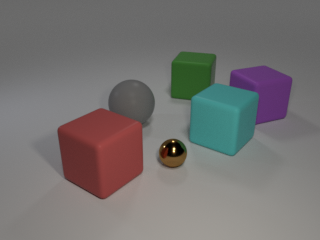

squealing sees : 


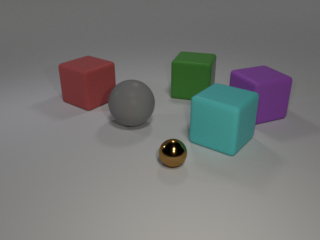

other user : there is a little shiny ball in the middle. th color is omething between golden and brown
squealing : agree
other user : six objects
squealing : and the other objects are four cubes in different colours and one grey ball
other user : yes
other user : the biggest is the red cube on the left
other user : next to the golden ball and in front of the grey ball
squealing : ah, 
squealing : I see the red cube behind the grey ball
squealing : in one axis with a bright blue cube
other user : no, the grey ball is in one axis with the blue cube
squealing : yes, and I see the red cube in one line with these two
squealing : then, this is a difference
other user : yes, /different
other user : HERRGOTT /different zum dritten mal :D

Room 195
short sees :  


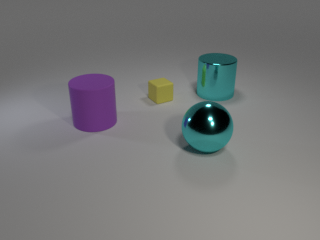

colorful sees : 


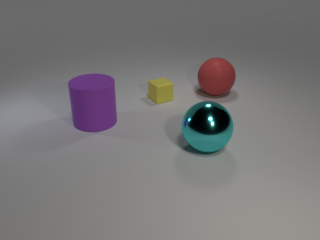

short : four objects
colorful : yes
short : purple cylinder to the left
colorful : big light shiny blue ball in front at right site
colorful : yes
short : yes, agree
short : tiny yellow cube in the center
colorful : yes
colorful : red cube right site next to it
colorful : no
colorful : not cube, ball
short : mh, I see a big bright blue cylinder to the right of it
short : same colour like the ball in front
colorful : then this is the difference
short : yes

Room 196
other user sees :  


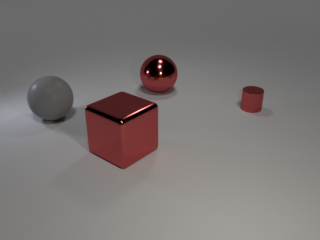

purring sees : 


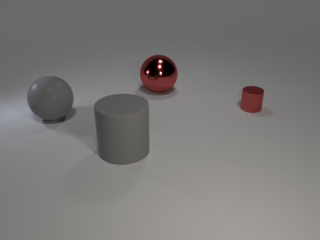

other user : three red objects
other user : and a grey one
purring : four objects
other user : yes
purring : mh, I see two red ones, two grey ones
purring : a cylinder and a ball of each color
other user : then this is /different. three red and one grey
purring : what object is grey in your view?
purring : the cylinder at front?
other user : one ball at the left site
purring : ok
purring : and what is to the right of it?
other user : a big shiny red cube
purring : ah, that is completely different. I see a big grey cylinder

Room 197
homeless sees :  


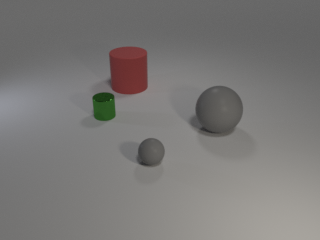

other user sees : 


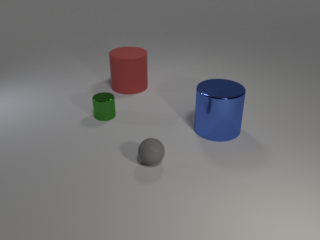

homeless : four objects
other user : yes
other user : three cyl, one ball
homeless : nope, two cylinders, two balls
homeless : both balls grey
other user : one grey ball in the middle front
homeless : one big on the right, one small in the front, center
other user : on the right site is a green cyl. /different
homeless : ok. 
homeless : do you see the red big cylinder in the back?
other user : yes
homeless : and a green shiny cylinder in front of it?
other user : sorry, i made a mistake
other user : on the RIGHT site is a big shiny blue cyl
other user : one LEFT is the tiny green one
homeless : ah, but I don't see that either
homeless : yes, the tiny green one I see as well
other user : than this is the difference
homeless : but instead of the shiny blue cylinder I see a big grey ball
homeless : yup

Room 198
wandering sees :  


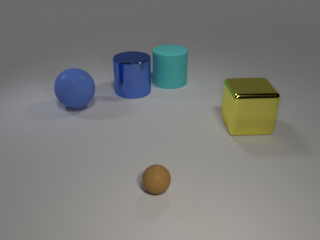

other user sees : 


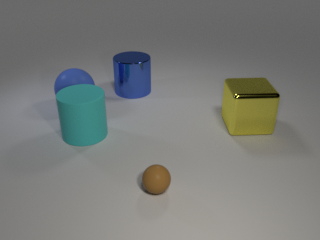

other user : five objects. two cyl, two balls, one cube
wandering : yes
wandering : the cube is big and shiny golden, on the right
other user : yes
other user : the three objects on the left are blue or bright blue
wandering : yes,
wandering : from left to right they are: blue ball, shiny blue cyl, bright blue cyl
other user : the bright blue cyl is not on the right but in front of the three objects
wandering : oh, ok
wandering : I see it like the object closest to the back
wandering : so, the position is different
other user : no, there is the shiny dark blue cyl
wandering : alright

Room 199
dull sees :  


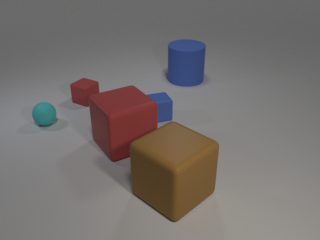

warm sees : 


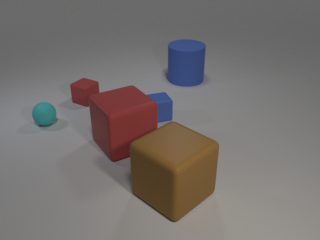

dull : six objects
warm : yup
dull : one light blue, two dark blue, two red, one khaki
warm : agree
warm : the khaki one is a big cube in the middle front
dull : yes, the biggest one
warm : and a red cube behind it
dull : yes
dull : the light blue is a tiny ball on the left
warm : yes
warm : there is another red cube, but small
dull : yes, between the light blue ball an the big red cube an a small blue cube
warm : yes, 
warm : but behind all of these objects
dull : yes
warm : and then, there is a blue cylinder in the back
dull : in the back is a blue cyl
dull : on the right site
warm : yes, slightly to the right

Room 200
dry sees :  


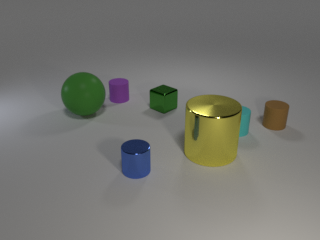

other user sees : 


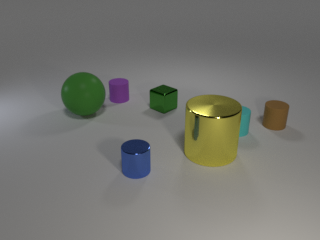

other user : five cyl, one cube, one ball
dry : yes
dry : the ball is on the left. It is big and green
other user : yes
other user : two shiny cyl in the front. a big golden an a small blue
dry : yes
dry : the small blue one is closer to the center
other user : not really
dry : it is slightly on the left, but closer to the center than the golden one
other user : a little bit
other user : but more in the center is a shiny green cube
dry : true
dry : this is in the center, but in the back
dry : together with the green ball it frames a purple cylinder
other user : yes
other user : there is a little nazi cylinder on the extreme right wing
dry : you mean the khaki one?
other user : yes
dry : and a little bright blue cylinder behind the big golden one
other user : yes

Room 201
snowy sees :  


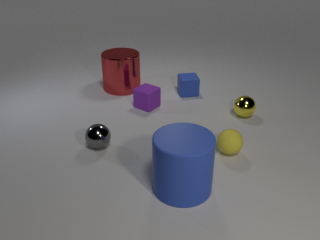

other user sees : 


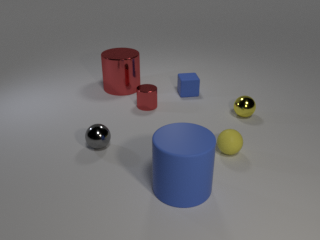

snowy : three balls, two cubes, two cyls
other user : seven objects
other user : no, one cube. blue one in the back
other user : between two red cyl and a golden ball
snowy : mh, I see the blue cube. But it is next to a purple cube
snowy : of the same size
snowy : and there is also a red shiny big cylinder
other user : there is no purple cube. this is /different

Room 202
frightened sees :  


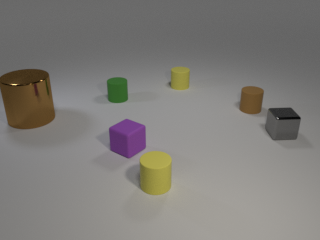

other user sees : 


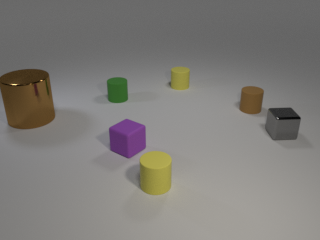

other user : big shiny brown cyl on the left rim
frightened : yes
other user : six other objects
frightened : closest to the big shiny cyl: a tiny green cyl in the back and a purple cube in the front
other user : yes. the others are two yellow cyl, one brown cyl, one grey cube
frightened : yes
frightened : the grey cube is shiny, on the very right
other user : yes
other user : the two yellow cyl are in the very front and very back
frightened : agree
frightened : and the left over cyan cyl is close to the grey cube on the right
other user : there is no cyan cyl
frightened : sorry, I meant khaki
other user : it is brown
other user : ok

Room 203
little sees :  


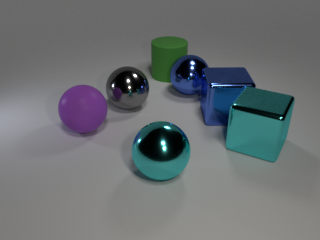

warm sees : 


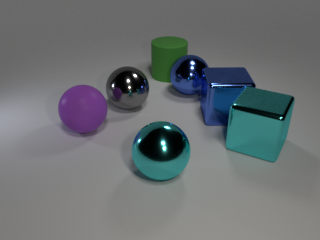

little : ready
warm : I see seven objects. four balls, two cubes and one cylinder
little : I see 4 balls ,one of them is in front of it, two cubes on the right side and 1 cylinder in the backround 
warm : yes, agree
warm : the ball in front is shiny and light blue
little : the ball in front is metallic and green ore blue 
warm : yes
warm : and the cubes are both shiny
little : the cube in the backround are green 
little : yes I agree, dthe cubes are blue and green
warm : I don't see a green cube
little : the green one is in front
warm : I only see blue cube and a turquoise one
warm : but it is shiny
little : okay, maybe it is tourquise
warm : and a purple ball on the left
little : yes
warm : and a metallic grey ball behind it
little : not behind a bit to the right side
warm : yes, agree
little : I would say, we see the same  
warm : do you see the green cylinder in the very back?
little : yes, 
warm : yes, then I think we do see the same image
little : same

Room 204
dry sees :  


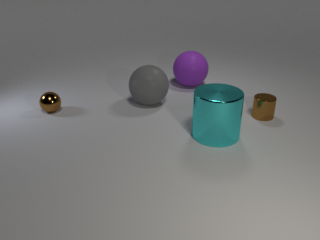

prickly sees : 


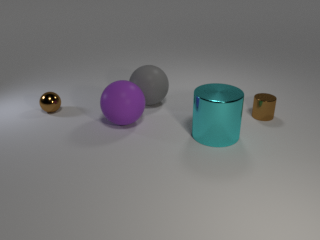

prickly : I see five objects
dry : 3 balls, 2 cylinder, 
dry : one ball is aside left
prickly : agree
prickly : yes, it is small
dry : a green relatively huge cylinder
dry : and a brown one on the right side
dry : one ball is purple
prickly : mh, yes green or blue cylinder
dry : yes
prickly : agree with the brown cyl on the right. it is shiny
prickly : and two more big balls
prickly : one is purple, the other is grey
prickly : slightly to the right
dry : yes one grey, the other one purple

Room 205
other user sees :  


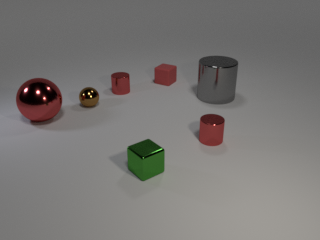

dusty sees : 


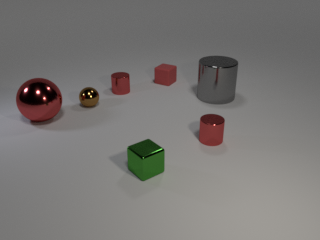

dusty : Hello
dusty : How are you this fine day
dusty : I can see 7 distinct items
dusty : There are 3 that seem to be the same size which is the smallest, 2 that have a medium size, 2 that have the biggest size 
other user : 7 objects, 2 balls, one big, one small, 2cubes , 3 cylinder
dusty : Indeed
dusty : 4 items are red (left to right: Big ball, small cylinder, small cube, medium cylinder)
dusty : The cylinders could have the same size but they look different based on perspective
other user : the ball on the left side is red and 
dusty : One golden ball, one green cube, one silver cylinder
dusty : The ball on the left side is indeed red, yes
dusty : 4 lamps seem to be reflected in the red ball on the left
dusty : The items all seem to be distinct, meaning there's not "groups" visible
other user : byes, you are right, bud didn´t you say the ball on the left side is grey?
dusty : The only non-reflective shape is the upper most cube (the one farthest away from the camera)
dusty : No, t

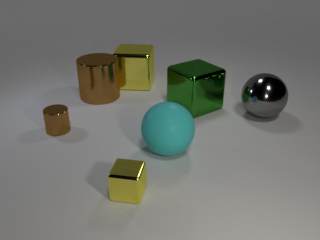

colossal sees : 


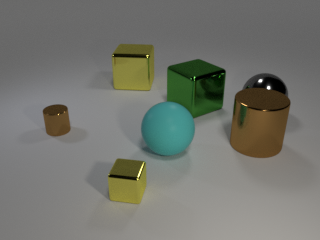

colossal : 7 objects
straight : yes, same
straight : one small golden shiny cube in the front
colossal : yupe
colossal : brown shiny cylinder on the left side
straight : and a cyan ball to the right, behind it
colossal : same
straight : agree to the cyl
straight : on the left
straight : and a grey shiny ball on the right
colossal : yes
straight : and a big shiny green cube behind the cyan ball
colossal : in front of it, there is big brown shiny cylinder
colossal : same
straight : in front of the cyan ball?
colossal : no, in front of grey ball
straight : on the right?
colossal : yes
straight : no, I see the brown shiny cyl on the right side, behind a small cyl of the same color
straight : and in front of a golden cube
straight : then, this is the difference

Room 207
warm sees :  


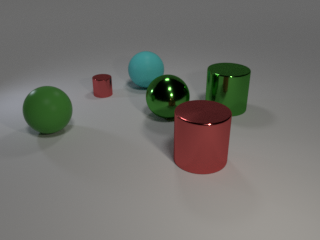

fuscia sees : 


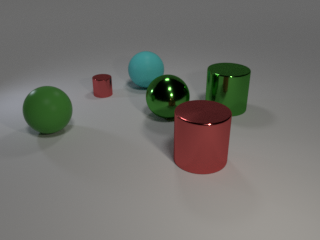

fuscia : 6 obj
warm : I see 6 objects
fuscia : red green ball on the left
warm : 3 balls, 3 cylinder
fuscia : yes
warm : red ball on the left side
warm : forget it, green ball on the left side
fuscia : ok
fuscia : then red small cylinder
warm : yes
fuscia : cyan ball
fuscia : green shiny ball
fuscia : red shiny cylinder in front
warm : yes and on the right side is a geen cylinder
fuscia : same

Room 225
dry sees :  


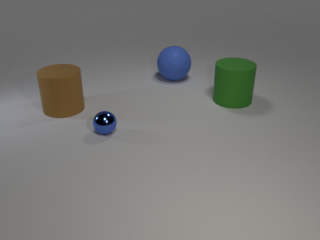

merry sees : 


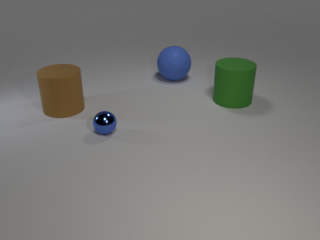

dry : What do you see?
dry : I see a blue ball in front
dry : another blue one in the back
merry : Left to right: Brown Zylinder, Blue Ball Blue Ball Green zylinder
dry : both of them are in the middle
dry : a yellow cylinder in the left...
dry : brown?
merry : Brown
dry : ...YELLOW
dry : ok.
merry : K
dry : yellowish brown
dry : but the shiny blue ball is closest to us
merry : Yes
dry : and the next blue ball, that is larger is farther away
merry : Yes
dry : perfect

Room 226
unsightly sees :  


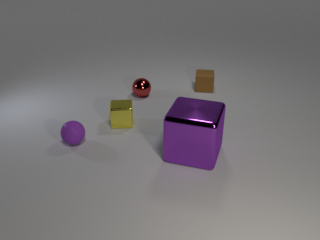

soft sees : 


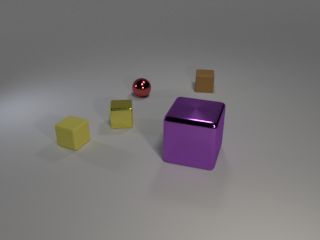

soft :  /ready
unsightly : left to right?
soft : Left to right: yellow cube, gold cube, red ball, pink cube and brown cube behind the purple one
soft : Pink = purple
unsightly : violet ball, yellow shiny small cube, red shiny small ball, purple shiny large cube and behind it small brown cube
soft : I have two cubes, yellow and golden
soft : 🌧
unsightly : me too
unsightly : one cube is shiny yellow goldish, the other one brownish
soft : Yes

Room 227
wandering sees :  


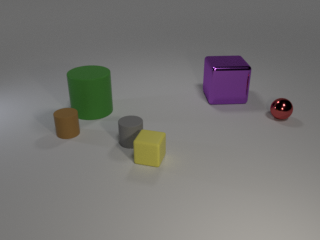

grieving sees : 


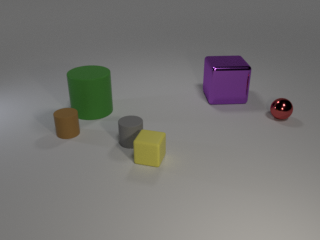

wandering : Left to right: brown Zylinder, green Zylinder, gray Z, yellow cube, purple shiny cube, red shiny ball
grieving : brown cylinder, green cylinder, grey cylinder, yellow cube, violet cube, red ball
wandering : Green and purple are big
grieving : yep
wandering : Purple and red are shiny?
grieving : yes



In [96]:
#colledt the dialogue data and display the dialogues, together with the room number (of the task room)
#and the images that were displayed in the game round
shortened_list,players_count_utterances,players_utterance,rooms_, dev_content_words,\
dev_all_content_words,dev_content_words_share,all_messages = main_exec(path_)

In [97]:
#len(first_answer_proposal)

In [98]:
def first_answer_proposed_by(first_answer_proposal,players_utterance ):
    ''' method to find player who proposed a first and a last agreement
        returns: first_answer_proposed_by - a list of strings stating 'player 1' or 'player 2'
                last_answer_proposed_by - a list of strings stating 'player 1' or 'player 2'
        args: first_answer_proposal - a list of first answer proposals (created manually)
                players_utterance - list of dictionaries per room with the player name as key and the related messages as value
                                
    '''
    first_answer_proposed_by = []
    last_answer_proposed_by = []
    i=0
    while i< len(first_answer_proposal):
        first_a_prop_by = 'none'
        last_a_prop_by = 'none'
        if first_answer_proposal[i]!='':
            for e in players_utterance[i].get(list(players_utterance[i].keys())[0]):
                if first_answer_proposal[i]==e[0]:
                    first_a_prop_by = 'player 1'
                else:
                    first_a_prop_by='player 2'

                #list last_answer_proposal is globally defined and was created manually
                if last_answer_proposal[i]!='':
                    if last_answer_proposal[i]==e[0]:
                        last_a_prop_by='player 1'
                    else:
                        last_a_prop_by = 'player 2'

        first_answer_proposed_by.append(first_a_prop_by)
        last_answer_proposed_by.append(last_a_prop_by)

        i+=1    
    return first_answer_proposed_by,last_answer_proposed_by

In [99]:
#obtain the information about the dialogues where the less/more dominant player made the first answer proposal    
first_answer_proposed_by ,last_answer_proposed_by = first_answer_proposed_by(first_answer_proposal,players_utterance)

In [100]:
more_less_talkative_found = []
label_more_talkative = []
label_less_talkative = []

label_more_utt_by = []
label_more_token_utt_by = []

more_talkative_player = []
less_talkative_player = []
more_token_utterances = []
more_utterances_in_total = []

p1_total_utt_num = []
p1_avg_token_per_utt = []
p1_avg_token_num_wo_stopwords = []

p2_total_utt_num = []
p2_avg_token_per_utt = []
p2_avg_token_num_wo_stopwords = []


for elem in players_count_utterances:
    more_talkative_p=False
    more_talkative =''
    less_talkative = ''
    more_token = ''
    more_utt = ''
    
    p1_total_utt_num.append(elem.get('player1').get('total num utt'))
    p1_avg_token_per_utt.append(round(elem.get('player1').get('avg token num/utt'),2))
    p1_avg_token_num_wo_stopwords.append(round(elem.get('player1').get('avg token num/utt wo stopwords'),2))
    
    p2_total_utt_num.append(elem.get('player2').get('total num utt'))
    p2_avg_token_per_utt.append(round(elem.get('player2').get('avg token num/utt'),2))
    p2_avg_token_num_wo_stopwords.append(round(elem.get('player2').get('avg token num/utt wo stopwords'),2))
    
    
    if elem.get('player1').get('total num utt')>=elem.get('player2').get('total num utt') and \
    elem.get('player1').get('avg token num/utt')>elem.get('player2').get('avg token num/utt'):
        more_talkative_p=True
        more_talkative = ('player 1',elem.get('player1'))
        
        label_more_talkative.append('player 1')
        label_less_talkative.append('player 2')
        
        label_more_utt_by.append('')
        label_more_token_utt_by.append('') 

        less_talkative = ('player 2',elem.get('player2'))      
        more_talkative_player.append(more_talkative)
        less_talkative_player.append(less_talkative)
        more_utterances_in_total.append('')
        more_token_utterances.append('')
    elif elem.get('player2').get('total num utt')>=elem.get('player1').get('total num utt') and \
    elem.get('player2').get('avg token num/utt')>elem.get('player1').get('avg token num/utt'):
        more_talkative_p=True
        more_talkative = ('player 2',elem.get('player2')) 
        
        label_more_talkative.append('player 2')
        label_less_talkative.append('player 1')
        label_more_utt_by.append('none')
        label_more_token_utt_by.append('none') 

        
        less_talkative = ('player 1',elem.get('player1')) 
        more_talkative_player.append(more_talkative)
        less_talkative_player.append(less_talkative)
        more_utterances_in_total.append('none')
        more_token_utterances.append('none')

    elif elem.get('player1').get('total num utt')>=elem.get('player2').get('total num utt') and \
    elem.get('player1').get('avg token num/utt')<=elem.get('player2').get('avg token num/utt'):
        more_talkative_p=False
        more_utt = ('player 1',elem.get('player1'))
        more_token = ('player 2',elem.get('player2'))
        
        label_more_talkative.append('none')
        label_less_talkative.append('none')
        label_more_utt_by.append('player 1')
        label_more_token_utt_by.append('player 2') 

        
        more_utterances_in_total.append(more_utt)
        more_token_utterances.append(more_token)
        more_talkative_player.append('')
        less_talkative_player.append('')
    elif elem.get('player2').get('total num utt')>=elem.get('player1').get('total num utt') and \
    elem.get('player2').get('avg token num/utt')<=elem.get('player1').get('avg token num/utt'):
        more_talkative_p = False
        more_token = ('player 1',elem.get('player1'))
        more_utt = ('player 2',elem.get('player2'))
        
        label_more_talkative.append('none')
        label_less_talkative.append('none')
        label_more_utt_by.append('player 2')
        label_more_token_utt_by.append('player 1') 

        more_talkative_player.append('')
        less_talkative_player.append('')
        more_utterances_in_total.append(more_utt)
        more_token_utterances.append(more_token)
        
    more_less_talkative_found.append(more_talkative_p)
    
    
        

In [101]:
dict_token_utt = {'more talkative player':label_more_talkative, 'less talkative player':label_less_talkative,\
                  'player who made more utterances': label_more_utt_by,\
                  'player with more token/utterance':label_more_token_utt_by,'more/less talkative found':more_less_talkative_found,\
                 'player 1 # utterances':p1_total_utt_num,'player 1 avg # token/utterance':p1_avg_token_per_utt,\
                  'player 1 avg # token/utterance without stopwords':p1_avg_token_num_wo_stopwords,\
                  'player 2 # utterances':p2_total_utt_num,'player 2 avg # token/utterance':p2_avg_token_per_utt,\
                    'player 2 avg # token/utterance without stopwords':p2_avg_token_num_wo_stopwords }
df_token_utt = pd.DataFrame(dict_token_utt)
df_token_utt

,more talkative player,less talkative player,player who made more utterances,player with more token/utterance,more/less talkative found,player 1 # utterances,player 1 avg # token/utterance,player 1 avg # token/utterance without stopwords,player 2 # utterances,player 2 avg # token/utterance,player 2 avg # token/utterance without stopwords
0,none,none,player 1,player 2,False,4,3.00,2.25,2,5.50,5.00
1,player 1,player 2,,,True,13,6.77,4.92,8,6.62,5.00
2,none,none,player 1,player 2,False,5,4.60,3.20,4,11.00,7.75
3,none,none,player 1,player 2,False,8,3.88,3.00,3,13.33,10.33
4,none,none,player 1,player 2,False,5,4.60,3.60,3,6.00,4.00
5,player 1,player 2,,,True,10,5.10,3.60,8,3.38,2.75
6,player 2,player 1,none,none,True,10,3.20,2.60,11,3.91,2.73
7,player 1,player 2,,,True,11,5.45,4.18,7,5.00,3.57
8,player 2,player 1,none,none,True,7,1.71,1.71,8,4.38,3.50
9,player 1,player 2,,,True,7,4.57,3.43,7,2.57,2.00


In [102]:
dict_token_utt = {'room':room_,'more/less talkative found':more_less_talkative_found,'more talkative player':label_more_talkative, 'less talkative player':label_less_talkative,\
                  'player who made more utterances': label_more_utt_by,\
                  'player with more token/utterance':label_more_token_utt_by,\
                  'first answer proposed by':first_answer_proposed_by,'last answer proposed by':last_answer_proposed_by,\
                  'player 1 avg # token/utterance without stopwords':p1_avg_token_num_wo_stopwords,\
                    'player 2 avg # token/utterance without stopwords':p2_avg_token_num_wo_stopwords }
df_token_utt = pd.DataFrame(dict_token_utt)
df_token_utt

,room,more/less talkative found,more talkative player,less talkative player,player who made more utterances,player with more token/utterance,first answer proposed by,last answer proposed by,player 1 avg # token/utterance without stopwords,player 2 avg # token/utterance without stopwords
0,176,False,none,none,player 1,player 2,none,none,2.25,5.00
1,177,True,player 1,player 2,,,player 2,none,4.92,5.00
2,178,False,none,none,player 1,player 2,player 1,none,3.20,7.75
3,179,False,none,none,player 1,player 2,none,none,3.00,10.33
4,180,False,none,none,player 1,player 2,player 1,none,3.60,4.00
5,182,True,player 1,player 2,,,player 2,player 2,3.60,2.75
6,183,True,player 2,player 1,none,none,none,none,2.60,2.73
7,184,True,player 1,player 2,,,none,none,4.18,3.57
8,185,True,player 2,player 1,none,none,none,none,1.71,3.50
9,186,True,player 1,player 2,,,none,none,3.43,2.00


In [103]:
grouped_by=df_token_utt.groupby('more/less talkative found').count()
count_ = grouped_by['room'].to_frame().rename(columns={"room": "# dialogues"})
count_

total = count_['# dialogues'][0]+count_['# dialogues'][1]
perc_with_talkative=(count_['# dialogues'][1]/total)*100
perc_without_talkative = (count_['# dialogues'][0]/total)*100
print(round(perc_with_talkative,2))
print(round(perc_without_talkative,2))

count_['% of dialogues with/without more talkative player']=pd.Series([round(perc_without_talkative,2),round(perc_with_talkative,2)])

63.64
36.36


In [104]:
#display the distribution of dialogues where a more and a less dominant (='talkative') player was identified
count_

,# dialogues,% of dialogues with/without more talkative player
more/less talkative found,,
False,12,36.36
True,21,63.64


In [105]:
#df_token_utt.sort_values('more/less talkative found')

In [106]:
#number_turns_bef_first_answer
dict_={'room ID':room_,'active or passive dialogue':active_passive,'# turns before first answer proposal':number_turns_bef_first_answer,\
    '# turns before last answer proposal':number_turns_bef_last_answer,\
    '# turns between first and last answer proposal':number_turns_bef_last_answer, 'explicit agreement on seeing an identical/different image':explicit_agreement }
df = pd.DataFrame(dict_)
df


,room ID,active or passive dialogue,# turns before first answer proposal,# turns before last answer proposal,# turns between first and last answer proposal,explicit agreement on seeing an identical/different image
0,176,passive,no answer proposal,no answer proposal,no answer proposal,no
1,177,passive,10,no answer proposal,no answer proposal,yes
2,178,passive,4,no answer proposal,no answer proposal,yes
3,179,passive,no answer proposal,no answer proposal,no answer proposal,no
4,180,passive,4,no answer proposal,no answer proposal,no
5,182,passive,4,8,8,yes
6,183,passive,no answer proposal,no answer proposal,no answer proposal,no
7,184,passive,no answer proposal,no answer proposal,no answer proposal,no
8,185,passive,no answer proposal,no answer proposal,no answer proposal,no
9,186,passive,no answer proposal,no answer proposal,no answer proposal,no


In [107]:

#explicit agreement on seeing an identical/different image

grouped_by=df.groupby('explicit agreement on seeing an identical/different image').count()
count_ = grouped_by['room ID'].to_frame().rename(columns={"room ID": "# dialogues"})
#count_
total = count_['# dialogues'][0]+count_['# dialogues'][1]
count_['% of dialogues with/without explitcit agreement'] = round((count_['# dialogues']/total)*100,2)

count_

,# dialogues,% of dialogues with/without explitcit agreement
explicit agreement on seeing an identical/different image,,
no,25,75.76
yes,8,24.24


In [108]:
dict_token_utt = {'room':room_,'more/less talkative found':more_less_talkative_found,'more talkative player':label_more_talkative, 'less talkative player':label_less_talkative,\
                  'player who made more utterances': label_more_utt_by,\
                  'player with more token/utterance':label_more_token_utt_by,\
                  'first answer proposed by':first_answer_proposed_by,'last answer proposed by':last_answer_proposed_by,\
                  'player 1 avg # token/utterance without stopwords':p1_avg_token_num_wo_stopwords,\
                    'player 2 avg # token/utterance without stopwords':p2_avg_token_num_wo_stopwords }
df_token_utt = pd.DataFrame(dict_token_utt)
df_token_utt

,room,more/less talkative found,more talkative player,less talkative player,player who made more utterances,player with more token/utterance,first answer proposed by,last answer proposed by,player 1 avg # token/utterance without stopwords,player 2 avg # token/utterance without stopwords
0,176,False,none,none,player 1,player 2,none,none,2.25,5.00
1,177,True,player 1,player 2,,,player 2,none,4.92,5.00
2,178,False,none,none,player 1,player 2,player 1,none,3.20,7.75
3,179,False,none,none,player 1,player 2,none,none,3.00,10.33
4,180,False,none,none,player 1,player 2,player 1,none,3.60,4.00
5,182,True,player 1,player 2,,,player 2,player 2,3.60,2.75
6,183,True,player 2,player 1,none,none,none,none,2.60,2.73
7,184,True,player 1,player 2,,,none,none,4.18,3.57
8,185,True,player 2,player 1,none,none,none,none,1.71,3.50
9,186,True,player 1,player 2,,,none,none,3.43,2.00


In [109]:
suggestion_1_by_talkative_player = []
i=0
while i<len(list(df_token_utt['more talkative player'])):
    if list(df_token_utt['more talkative player'])[i]==list(df_token_utt['first answer proposed by'])[i]:
        suggestion_1_by_talkative_player.append(True)
        
    else:
        suggestion_1_by_talkative_player.append(False)
       
    i+=1
suggestion_1_by_talkative_player
df_token_utt['more talkative player made first answer suggestion']=suggestion_1_by_talkative_player
df_token_utt.drop(df_token_utt[df_token_utt['more/less talkative found']==False].index, inplace=True)
df_token_utt

,room,more/less talkative found,more talkative player,less talkative player,player who made more utterances,player with more token/utterance,first answer proposed by,last answer proposed by,player 1 avg # token/utterance without stopwords,player 2 avg # token/utterance without stopwords,more talkative player made first answer suggestion
1,177,True,player 1,player 2,,,player 2,none,4.92,5.00,False
5,182,True,player 1,player 2,,,player 2,player 2,3.60,2.75,False
6,183,True,player 2,player 1,none,none,none,none,2.60,2.73,False
7,184,True,player 1,player 2,,,none,none,4.18,3.57,False
8,185,True,player 2,player 1,none,none,none,none,1.71,3.50,False
9,186,True,player 1,player 2,,,none,none,3.43,2.00,False
10,187,True,player 2,player 1,none,none,player 2,none,3.12,5.27,True
11,188,True,player 1,player 2,,,player 2,player 2,4.48,3.88,False
12,189,True,player 2,player 1,none,none,player 1,none,1.60,4.70,False
13,190,True,player 1,player 2,,,player 2,none,4.87,3.83,False


In [110]:
df_token_utt.groupby('more talkative player made first answer suggestion').count()


,room,more/less talkative found,more talkative player,less talkative player,player who made more utterances,player with more token/utterance,first answer proposed by,last answer proposed by,player 1 avg # token/utterance without stopwords,player 2 avg # token/utterance without stopwords
more talkative player made first answer suggestion,,,,,,,,,,
False,16,16,16,16,16,16,16,16,16,16
True,5,5,5,5,5,5,5,5,5,5


In [111]:
grouped_by=df_token_utt.groupby('more talkative player made first answer suggestion').count()
count_ = grouped_by['room'].to_frame()#.rename(columns={"room ID": "# dialogues where more talkative player makes first answer proposal"})
#count_
total = count_['room'][0]+count_['room'][1]
count_['% of dialogues where more talkative player makes first answer proposal'] = round((count_['room']/total)*100,2)

count_.rename(columns={"room": "# dialogues "})

,# dialogues,% of dialogues where more talkative player makes first answer proposal
more talkative player made first answer suggestion,,
False,16,76.19
True,5,23.81


In [112]:
df_token_utt

,room,more/less talkative found,more talkative player,less talkative player,player who made more utterances,player with more token/utterance,first answer proposed by,last answer proposed by,player 1 avg # token/utterance without stopwords,player 2 avg # token/utterance without stopwords,more talkative player made first answer suggestion
1,177,True,player 1,player 2,,,player 2,none,4.92,5.00,False
5,182,True,player 1,player 2,,,player 2,player 2,3.60,2.75,False
6,183,True,player 2,player 1,none,none,none,none,2.60,2.73,False
7,184,True,player 1,player 2,,,none,none,4.18,3.57,False
8,185,True,player 2,player 1,none,none,none,none,1.71,3.50,False
9,186,True,player 1,player 2,,,none,none,3.43,2.00,False
10,187,True,player 2,player 1,none,none,player 2,none,3.12,5.27,True
11,188,True,player 1,player 2,,,player 2,player 2,4.48,3.88,False
12,189,True,player 2,player 1,none,none,player 1,none,1.60,4.70,False
13,190,True,player 1,player 2,,,player 2,none,4.87,3.83,False


In [113]:
more_content_token_by = []
i=0
while i<len(list(df_token_utt['player 2 avg # token/utterance without stopwords'])):
    if list(df_token_utt['player 2 avg # token/utterance without stopwords'])[i]==list(df_token_utt['player 1 avg # token/utterance without stopwords'])[i]:
        more_content_token_by.append('equal')
    elif list(df_token_utt['player 2 avg # token/utterance without stopwords'])[i]>list(df_token_utt['player 1 avg # token/utterance without stopwords'])[i]:
        more_content_token_by.append('player 2')
    else:
        more_content_token_by.append('player 1')
    i+=1

In [114]:
more_content_token_by = []
i=0
while i<len(list(df_token_utt['player 2 avg # token/utterance without stopwords'])):
    if list(df_token_utt['player 2 avg # token/utterance without stopwords'])[i]==list(df_token_utt['player 1 avg # token/utterance without stopwords'])[i]:
        more_content_token_by.append('equal')
    elif list(df_token_utt['player 2 avg # token/utterance without stopwords'])[i]>list(df_token_utt['player 1 avg # token/utterance without stopwords'])[i]:
        more_content_token_by.append('player 2')
    else:
        more_content_token_by.append('player 1')
    i+=1

In [115]:
more_talkative_player_utt_more_c_token=[]
i=0
while i<len(list(df_token_utt['more talkative player'])):
    if list(df_token_utt['more talkative player'])[i]==more_content_token_by[i]:
        more_talkative_player_utt_more_c_token.append(True)

    else:
        more_talkative_player_utt_more_c_token.append(False)
    i+=1

In [116]:
#more_talkative_player_utt_more_c_token

In [117]:
df_token_utt['more talkative player wrote more content token']=more_talkative_player_utt_more_c_token
df_token_utt

,room,more/less talkative found,more talkative player,less talkative player,player who made more utterances,player with more token/utterance,first answer proposed by,last answer proposed by,player 1 avg # token/utterance without stopwords,player 2 avg # token/utterance without stopwords,more talkative player made first answer suggestion,more talkative player wrote more content token
1,177,True,player 1,player 2,,,player 2,none,4.92,5.00,False,False
5,182,True,player 1,player 2,,,player 2,player 2,3.60,2.75,False,True
6,183,True,player 2,player 1,none,none,none,none,2.60,2.73,False,True
7,184,True,player 1,player 2,,,none,none,4.18,3.57,False,True
8,185,True,player 2,player 1,none,none,none,none,1.71,3.50,False,True
9,186,True,player 1,player 2,,,none,none,3.43,2.00,False,True
10,187,True,player 2,player 1,none,none,player 2,none,3.12,5.27,True,True
11,188,True,player 1,player 2,,,player 2,player 2,4.48,3.88,False,True
12,189,True,player 2,player 1,none,none,player 1,none,1.60,4.70,False,True
13,190,True,player 1,player 2,,,player 2,none,4.87,3.83,False,True


In [118]:
grouped_by=df_token_utt.groupby('more talkative player wrote more content token').count()
count_ = grouped_by['room'].to_frame()#.rename(columns={"room ID": "# dialogues where more talkative player makes first answer proposal"})
#count_
total = count_['room'][0]+count_['room'][1]
count_['% of dialogues where more talkative player wrote more content token'] = round((count_['room']/total)*100,2)

count_.rename(columns={"room": "# dialogues "})

,# dialogues,% of dialogues where more talkative player wrote more content token
more talkative player wrote more content token,,
False,2,9.52
True,19,90.48


In [119]:
#df_token_utt['player 1 avg # token/utterance without stopwords']

In [120]:
len(number_turns_bef_last_answer)
len(number_turns_bef_first_answer)

33

Investigate the number of turns needed

In [121]:
#analyzing Hypothesis 'more than one turn per player before an agreement'
dict_ana_turns_bef_agreement = {'room ID':room_,'# turns': count_turns_,'# turns before first answer proposal':number_turns_bef_first_answer,\
    '# turns before last answer proposal':number_turns_bef_last_answer,'explicit agreement on seeing an identical/different image':explicit_agreement }
df_agreement = pd.DataFrame(dict_ana_turns_bef_agreement)
df_agreement

,room ID,# turns,# turns before first answer proposal,# turns before last answer proposal,explicit agreement on seeing an identical/different image
0,176,4,no answer proposal,no answer proposal,no
1,177,12,10,no answer proposal,yes
2,178,5,4,no answer proposal,yes
3,179,6,no answer proposal,no answer proposal,no
4,180,4,4,no answer proposal,no
5,182,9,4,8,yes
6,183,14,no answer proposal,no answer proposal,no
7,184,9,no answer proposal,no answer proposal,no
8,185,10,no answer proposal,no answer proposal,no
9,186,11,no answer proposal,no answer proposal,no


In [122]:
#df['# turns'].min()

In [123]:
#find the minimum number of turns before a first answer proposal:
list_num_turns_answer_prop = []
for e in number_turns_bef_first_answer:
    if type(e)!=str: 
        list_num_turns_answer_prop.append(e)
min(list_num_turns_answer_prop)

3

In [124]:
#df_only_explicit_agreement
df_agreement.drop(df_agreement[df_agreement['explicit agreement on seeing an identical/different image']=='no'].index, inplace=True)
df_agreement


,room ID,# turns,# turns before first answer proposal,# turns before last answer proposal,explicit agreement on seeing an identical/different image
1,177,12,10,no answer proposal,yes
2,178,5,4,no answer proposal,yes
5,182,9,4,8,yes
10,187,13,10,no answer proposal,yes
11,188,27,4,26,yes
17,195,8,7,no answer proposal,yes
19,197,12,11,no answer proposal,yes
25,203,20,19,no answer proposal,yes


In [125]:
num_turns_before_explicit_agreement = [11,5,9,11,27,8,12,20]


In [126]:
pair_of_explicit_agreement= ['I guess we see the same image - I think so too','same image?     - yes',\
                            'so, that is different - yes','I think we see the same image - I agree',\
                            'Okay, then the difference is the color of the red/ orange cube. And shiny/ not shiny brown cube - yupe',\
                            'then this is the difference - yes', 'than this is the difference - yup',\
                            'yes, then I think we do see the same image - same']

len(pair_of_explicit_agreement)

8

In [127]:
df_agreement['# turns before explicit agreement']=num_turns_before_explicit_agreement

In [128]:
df_agreement['agreement turns']= pair_of_explicit_agreement

In [129]:
df_agreement

,room ID,# turns,# turns before first answer proposal,# turns before last answer proposal,explicit agreement on seeing an identical/different image,# turns before explicit agreement,agreement turns
1,177,12,10,no answer proposal,yes,11,I guess we see the same image - I think so too
2,178,5,4,no answer proposal,yes,5,same image? - yes
5,182,9,4,8,yes,9,"so, that is different - yes"
10,187,13,10,no answer proposal,yes,11,I think we see the same image - I agree
11,188,27,4,26,yes,27,"Okay, then the difference is the color of the ..."
17,195,8,7,no answer proposal,yes,8,then this is the difference - yes
19,197,12,11,no answer proposal,yes,12,than this is the difference - yup
25,203,20,19,no answer proposal,yes,20,"yes, then I think we do see the same image - same"


In [130]:
print('minimum number of turns before an explicit agreement was reached:')
print(df_agreement['# turns before explicit agreement'].min())
print()
print('average number of turns before an explicit agreement was reached:')
print(df_agreement['# turns before explicit agreement'].mean())
print()
print('average number of turns in dialogues with explicit agreement: ')
print(df_agreement['# turns'].mean())

minimum number of turns before an explicit agreement was reached:
5

average number of turns before an explicit agreement was reached:
12.875

average number of turns in dialogues with explicit agreement: 
13.25


Investigate the strategies that were developed by the players throughout the dialogues. 

In [131]:
#Strategies:
#several strategies were found:
# s01. total object number - stating the total number of objects in the image (mostly in the beginning)
# s02. object shape - describing the shapes of the objects
# s03. object color - stating the color (and material) of the objects
# s04. object size - giving information about the relative size of the objects
# s05. object position - stating the relation of objects to one another/describing where the object is located in the image
# s06. agreement: from left to right - going through all the visible objects from left to right
# s07. agreement: from right to left - going through all the visible objects from right to left
# s08. agreement: bottom to top - going through all the visible objects from bottom to top
# s09. agreement: top to bottom - going through all the visible objects from top to bottom
# s10. object numbering - enumerating objects

_01_=[1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,1,1,0,1,1]
_02_ =[1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1]
_03_ =[0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1]
_04_ =[0,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1]
_05_ =[0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1]
_06_= [0,0,0,0,0,0,1,0,1,1,1,1,1,0,1,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,1]
_07_= [0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
_08_= [0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
#_09_= [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
_09_= [0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]

total_object_number = transform_0_1_yes_no_list(_01_)
object_shape = transform_0_1_yes_no_list(_02_)
object_color = transform_0_1_yes_no_list(_03_)
object_size  = transform_0_1_yes_no_list(_04_)
object_pos   = transform_0_1_yes_no_list(_05_)
left_to_right= transform_0_1_yes_no_list(_06_)
right_to_left= transform_0_1_yes_no_list(_07_)
bottom_to_top= transform_0_1_yes_no_list(_08_)
#top_to_bottom= transform_0_1_yes_no_list(_09_)
obj_numbering= transform_0_1_yes_no_list(_09_)

In [133]:
strategies_dict={'room ID':room_,'# turns': count_turns_,'same/different image':image_same_different,\
                 'players labeled':players_label,'strategy total number of objects':total_object_number,\
                'strategy object shape':object_shape,'strategy object color':object_color,\
                 'strategy object size':object_size,'strategy object position':object_pos,\
                'strategy left to right':left_to_right,'strategy right to left':right_to_left,\
                 'strategy bottom to top':bottom_to_top, \
                 'strategy object numbering':obj_numbering}
strat_df=pd.DataFrame(strategies_dict)
strat_df

,room ID,# turns,same/different image,players labeled,strategy total number of objects,strategy object shape,strategy object color,strategy object size,strategy object position,strategy left to right,strategy right to left,strategy bottom to top,strategy object numbering
0,176,4,different image,incorrect,yes,yes,no,no,no,no,no,no,no
1,177,12,same image,correct,yes,yes,yes,yes,yes,no,no,no,no
2,178,5,same image,correct,yes,yes,yes,yes,yes,no,no,no,no
3,179,6,same image,correct,yes,yes,yes,yes,yes,no,yes,no,no
4,180,4,same image,correct,yes,yes,yes,yes,yes,no,yes,no,no
5,182,9,different image,correct,yes,yes,yes,yes,yes,no,no,no,no
6,183,14,same image,correct,yes,yes,yes,yes,yes,yes,no,no,no
7,184,9,different image,incorrect,yes,yes,yes,yes,yes,no,no,no,no
8,185,10,same image,correct,yes,yes,yes,no,yes,yes,no,no,no
9,186,11,same image,correct,yes,yes,yes,yes,yes,yes,no,no,no


In [134]:
type(strat_df['strategy object color'].value_counts())

pandas.core.series.Series

In [135]:
#strat_df['strategy object color'].value_counts()[0]

In [136]:
#create a dataframe showing which strategies were used in each dialogues
df_strategies = pd.concat([strat_df['strategy total number of objects'].value_counts(),strat_df['strategy object shape'].value_counts(),\
                           strat_df['strategy object color'].value_counts(),strat_df['strategy object size'].value_counts(), \
                           strat_df['strategy object position'].value_counts(),\
                           strat_df['strategy left to right'].value_counts(),strat_df['strategy right to left'].value_counts(),\
                           strat_df['strategy bottom to top'].value_counts(), \
                           strat_df['strategy object numbering'].value_counts()], axis=1)

In [137]:
#df_strat_trans = df_strategies.transpose()

In [138]:
df_strat_trans = df_strategies.transpose()
df_strat_trans['yes'] = df_strat_trans['yes'].fillna(0)
df_strat_trans['no'] = df_strat_trans['no'].fillna(0)
df_strat_trans

,yes,no
strategy total number of objects,30.0,3.0
strategy object shape,33.0,0.0
strategy object color,32.0,1.0
strategy object size,30.0,3.0
strategy object position,32.0,1.0
strategy left to right,13.0,20.0
strategy right to left,2.0,31.0
strategy bottom to top,2.0,31.0
strategy object numbering,1.0,32.0


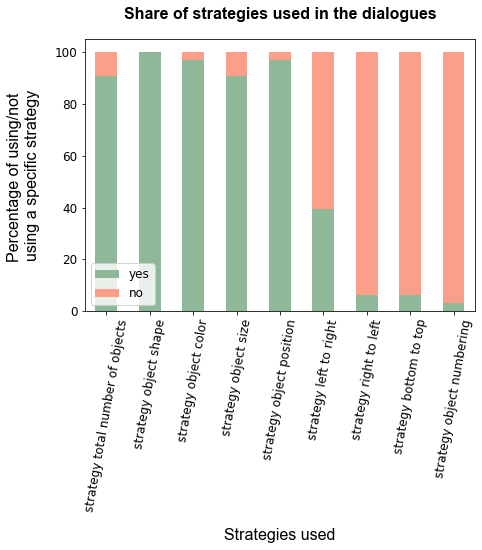

In [139]:
#plot the overall usage of strategies throughout the dialogues
stacked_data = df_strat_trans.apply(lambda x: x*100/sum(x), axis=1)
stacked_data.plot(kind="bar", stacked=True, color=color_true_false)
plt.title("Share of strategies used in the dialogues", **axis_font_title, pad=20)

#plt.figure(figsize=(10,15))
plt.xlabel("Strategies used", **axis_font, labelpad=15)
plt.legend(loc='lower left',prop={'size': 12})
plt.xticks(fontsize=12,rotation=80)
plt.yticks(fontsize=12)

plt.ylabel("Percentage of using/not \nusing a specific strategy", **axis_font, labelpad=15)
fig = plt.gcf()
fig.set_size_inches(7,5)
plt.savefig('results/visuals/strategies_used_total.png',bbox_inches='tight')

In [140]:
strat_df_correct=strat_df.copy()
strat_df_correct

,room ID,# turns,same/different image,players labeled,strategy total number of objects,strategy object shape,strategy object color,strategy object size,strategy object position,strategy left to right,strategy right to left,strategy bottom to top,strategy object numbering
0,176,4,different image,incorrect,yes,yes,no,no,no,no,no,no,no
1,177,12,same image,correct,yes,yes,yes,yes,yes,no,no,no,no
2,178,5,same image,correct,yes,yes,yes,yes,yes,no,no,no,no
3,179,6,same image,correct,yes,yes,yes,yes,yes,no,yes,no,no
4,180,4,same image,correct,yes,yes,yes,yes,yes,no,yes,no,no
5,182,9,different image,correct,yes,yes,yes,yes,yes,no,no,no,no
6,183,14,same image,correct,yes,yes,yes,yes,yes,yes,no,no,no
7,184,9,different image,incorrect,yes,yes,yes,yes,yes,no,no,no,no
8,185,10,same image,correct,yes,yes,yes,no,yes,yes,no,no,no
9,186,11,same image,correct,yes,yes,yes,yes,yes,yes,no,no,no


In [141]:
strat_df_correct.drop(strat_df_correct[strat_df_correct['players labeled']=='incorrect'].index,inplace=True)

In [142]:
df_strategies_correct_label = pd.concat([strat_df_correct['strategy total number of objects'].value_counts(),strat_df_correct['strategy object shape'].value_counts(),\
                           strat_df_correct['strategy object color'].value_counts(),strat_df_correct['strategy object size'].value_counts(), \
                           strat_df_correct['strategy object position'].value_counts(),\
                           strat_df_correct['strategy left to right'].value_counts(),strat_df_correct['strategy right to left'].value_counts(),\
                           strat_df_correct['strategy bottom to top'].value_counts(),\
                           strat_df_correct['strategy object numbering'].value_counts()], axis=1)

In [143]:
df_strat_trans_corr_label = df_strategies_correct_label.transpose()
df_strat_trans_corr_label['yes'] = df_strat_trans_corr_label['yes'].fillna(0)
df_strat_trans_corr_label['no'] = df_strat_trans_corr_label['no'].fillna(0)
df_strat_trans_corr_label

,yes,no
strategy total number of objects,27.0,2.0
strategy object shape,29.0,0.0
strategy object color,29.0,0.0
strategy object size,28.0,1.0
strategy object position,29.0,0.0
strategy left to right,12.0,17.0
strategy right to left,2.0,27.0
strategy bottom to top,2.0,27.0
strategy object numbering,1.0,28.0


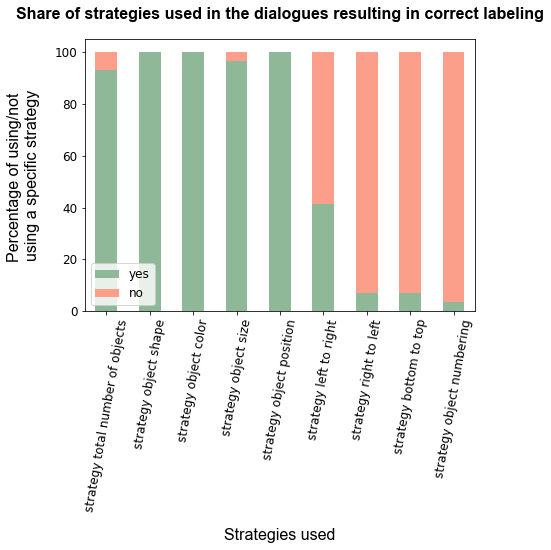

In [144]:
#plot the usage of strategies throughout the dialogues that resulted in correct labeling
stacked_data = df_strat_trans_corr_label.apply(lambda x: x*100/sum(x), axis=1)
stacked_data.plot(kind="bar", stacked=True, color=color_true_false)
plt.title("Share of strategies used in the dialogues resulting in correct labeling", **axis_font_title, pad=20)

#plt.figure(figsize=(10,15))
plt.xlabel("Strategies used", **axis_font, labelpad=15)
plt.legend(loc='lower left',prop={'size': 12})
plt.xticks(fontsize=12,rotation=80)
plt.yticks(fontsize=12)

plt.ylabel("Percentage of using/not \nusing a specific strategy", **axis_font, labelpad=15)
fig = plt.gcf()
fig.set_size_inches(7,5)
#plt.savefig('results/visuals/strategies_used_corr_label.png',bbox_inches='tight')

In [145]:
strat_df_incorrect=strat_df.copy()
#strat_df_incorrect
#strat_df.drop(strat_df[strat_df['players labeled']=='correct'].index,inplace=True)

In [146]:
strat_df_incorrect.drop(strat_df_incorrect[strat_df_incorrect['players labeled']=='correct'].index,inplace=True)

In [147]:
strat_df_incorrect

,room ID,# turns,same/different image,players labeled,strategy total number of objects,strategy object shape,strategy object color,strategy object size,strategy object position,strategy left to right,strategy right to left,strategy bottom to top,strategy object numbering
0,176,4,different image,incorrect,yes,yes,no,no,no,no,no,no,no
7,184,9,different image,incorrect,yes,yes,yes,yes,yes,no,no,no,no
26,204,7,different image,incorrect,yes,yes,yes,yes,yes,no,no,no,no
30,225,10,same image,incorrect,no,yes,yes,no,yes,yes,no,no,no


In [148]:
df_strategies_incorrect_label = pd.concat([strat_df_incorrect['strategy total number of objects'].value_counts(),strat_df_incorrect['strategy object shape'].value_counts(),\
                           strat_df_incorrect['strategy object color'].value_counts(),strat_df_incorrect['strategy object size'].value_counts(), \
                           strat_df_incorrect['strategy object position'].value_counts(),\
                           strat_df_incorrect['strategy left to right'].value_counts(),strat_df_incorrect['strategy right to left'].value_counts(),\
                           strat_df_incorrect['strategy bottom to top'].value_counts(), \
                           strat_df_incorrect['strategy object numbering'].value_counts()], axis=1)

In [149]:
df_strat_trans_incorr_label = df_strategies_incorrect_label.transpose()
df_strat_trans_incorr_label['yes'] = df_strat_trans_incorr_label['yes'].fillna(0)
df_strat_trans_incorr_label['no'] = df_strat_trans_incorr_label['no'].fillna(0)
df_strat_trans_incorr_label

,yes,no
strategy total number of objects,3.0,1.0
strategy object shape,4.0,0.0
strategy object color,3.0,1.0
strategy object size,2.0,2.0
strategy object position,3.0,1.0
strategy left to right,1.0,3.0
strategy right to left,0.0,4.0
strategy bottom to top,0.0,4.0
strategy object numbering,0.0,4.0


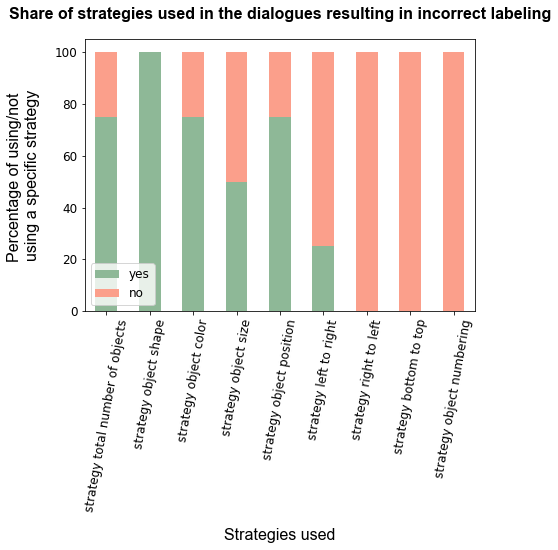

In [150]:
#plot the usage of strategies throughout the dialogues that resulted in incorrect labeling

stacked_data = df_strat_trans_incorr_label.apply(lambda x: x*100/sum(x), axis=1)
stacked_data.plot(kind="bar", stacked=True, color=color_true_false)
plt.title("Share of strategies used in the dialogues resulting in incorrect labeling", **axis_font_title, pad=20)

plt.xlabel("Strategies used", **axis_font, labelpad=15)
plt.legend(loc='lower left',prop={'size': 12})
plt.xticks(fontsize=12,rotation=80)
plt.yticks(fontsize=12)

plt.ylabel("Percentage of using/not \nusing a specific strategy", **axis_font, labelpad=15)
fig = plt.gcf()
fig.set_size_inches(7,5)
#plt.savefig('results/visuals/strategies_used_incorrect_label.png',bbox_inches='tight')